# RetinaMNIST Diabetic Retinopathy Classification

In [1]:
!pip install medmnist==3.0.2 torchinfo==1.8.0 coral_pytorch==1.4.0 grad-cam==1.5.5 timm==1.0.28

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 65.6 MB/s eta 0:00:0000:0100:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 13.5 MB/s eta 0:00:00
  Created wheel for grad-cam: filename=grad_cam-1.5.5-py3-none-any.whl size=44284 sha256=f6b0380a8ec72e8fa9d1eeb72c2ec2ff6203cc53a38c92f708be7bc557687c56
  Stored in directory: /root/.cache/pip/wheels/fb/3b/09/2afc520f3d69bc26ae6bd87416759c820a3f7d05c1a077bbf6
Successfully built grad-cam


## 1. Environment setup and fix random seed

In [22]:
import random
import numpy as np
import os
import hashlib
from matplotlib import pyplot as plt
from PIL import Image
from tqdm import tqdm
import cv2
import copy
import timm
from typing import Optional

import torch
from torch import nn
from torchvision.transforms import v2
from torchvision.datasets import ImageFolder
from torchinfo import summary
from torch.utils.data import DataLoader, Dataset
from torch.nn import functional as F


import sklearn
from sklearn.model_selection import StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import f1_score, cohen_kappa_score, accuracy_score, confusion_matrix, ConfusionMatrixDisplay, roc_auc_score, roc_curve, auc, classification_report


from medmnist import RetinaMNIST

from coral_pytorch.layers import CoralLayer
from coral_pytorch.losses import coral_loss
from coral_pytorch.dataset import levels_from_labelbatch, proba_to_label

from pytorch_grad_cam import HiResCAM, FinerCAM, LayerCAM
from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget




def set_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark     = False
    os.environ['PYTHONHASHSEED'] = str(seed)
    os.environ['CUBLAS_WORKSPACE_CONFIG'] = ':4096:8'

SEED = 42
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
PREPROCESSED_DIR = "/content/preprocessed"

set_seed(SEED)

## 2. Load the dataset

The RetinaMNIST dataset is derived from the [DeepDRiD dataset](https://zenodo.org/records/6452623), consisting of 1,600 retinal fundus images for 5-level diabetic retinopathy grading.

Description of classes and relative anomalies from the [DeepDRiD paper](https://www.sciencedirect.com/science/article/pii/S2666389922001040):

Disease severity level |	Descriptions | Findings observable on dilated ophthalmoscopy
|--------------|---------------|------------------|
Grade 0 |	no apparent retinopathy |	no abnormalities
Grade 1	| mild NPDR	| microaneurysms only
Grade 2	| moderate NPDR |	between just microaneurysms and severe NPDR
Grade 3	| severe NPDR	| any of the following: more than 20 intraretinal hemorrhages in each of 4 quadrants; definite venous beading in more than 2 quadrants; prominent intraretinal microvascular abnormalities in more than 1 quadrant; no signs of PDR retinopathy
Grade 4	| Proliferative DR	| one or more of the following: neovascularization; vitreous/preretinal hemorrhage

*A comprehensive guide detailing the visual characteristics that can be used to discriminate different grades is available [here](https://pmc.ncbi.nlm.nih.gov/articles/PMC10436766/).*

### Dataset license

RetinaMNIST is part of the [MedMNIST](https://medmnist.com/) collection and is licensed under *Creative Commons Attribution 4.0 International (CC BY 4.0)*.

Usage restrictions:
- The dataset is intended for research and educational purposes, not for clinical use.
- Proper attribution to both MedMNIST and DeepDRiD is required.
- The code is distributed under Apache-2.0 License.

### References:

- Yang, J. et al. (2023). MedMNIST v2: A Large-Scale Lightweight Benchmark for 2D and 3D Biomedical Image Classification.
- Liu, R. et al. (2022). DeepDRiD: Diabetic Retinopathy Grading and Image Quality Estimation.

In [5]:
train_dataset = RetinaMNIST(split='train', download=True, size=224)
val_dataset = RetinaMNIST(split='val', download=True, size=224)
test_dataset = RetinaMNIST(split='test', download=True, size=224)

100%|██████████| 128M/128M [02:28<00:00, 864kB/s]  


## 3. Data exploration and preprocessing

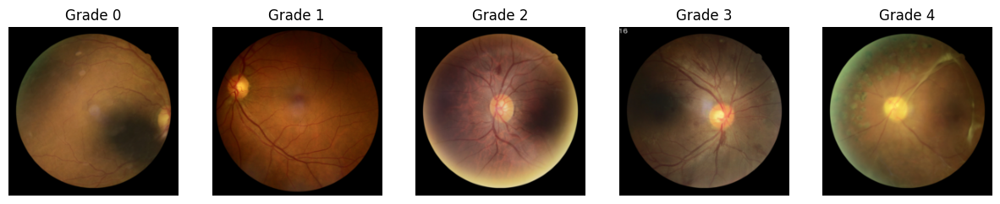

In [6]:
classes = np.unique(train_dataset.labels.flatten())

sample_images = []
for c in classes:
    labels_flat = train_dataset.labels.flatten()
    idx = np.where(labels_flat == c)[0][0]
    img_arr = np.squeeze(train_dataset.imgs[idx])
    sample_images.append(img_arr)

plt.figure(figsize=(15, 5))
for i, img_arr in enumerate(sample_images):
    plt.subplot(1, len(sample_images), i + 1)
    if img_arr.ndim == 3:
        plt.imshow(img_arr)
    else:
        plt.imshow(img_arr, cmap='gray')
    plt.title(f'Grade {int(classes[i])}')
    plt.axis('off')
plt.show()

From this plot we can confirm and try to visualize the anomalies described in the previous table. For example, we can locate in the Grade 2 image a blot haemorrhage in the upper-central part of the retina. Similar haemorrhages are present in Grade 3 image, in multiple instances across the whole retina. While, in the Grade 4 image, multiple gray dots in the retina, most probably neovascularizations, are widely present in the left part of the retina.

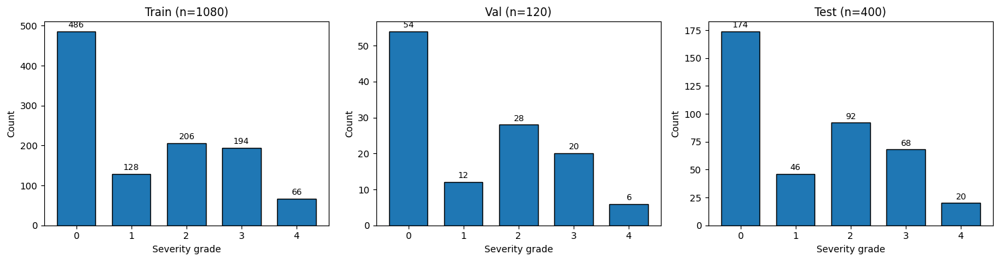

In [7]:
fig, axes = plt.subplots(1, 3, figsize=(15, 4))

for ax, split_name, dataset in zip(axes,
                                    ['Train', 'Val', 'Test'],
                                    [train_dataset, val_dataset, test_dataset]):
    labels = dataset.labels.flatten()
    counts = np.bincount(labels, minlength=len(classes))
    ax.bar(classes, counts, edgecolor='black', width=0.7)
    ax.set_xticks(classes)
    ax.set_title(f'{split_name} (n={len(labels)})')
    ax.set_xlabel('Severity grade')
    ax.set_ylabel('Count')
    for cls, cnt in zip(classes, counts):
        ax.text(cls, cnt + max(counts) * 0.01, str(cnt),
                ha='center', va='bottom', fontsize=9)

plt.tight_layout()
plt.show()

From class distribution plots across the different splits, we can observe how the dataset is strongly skewed towards the healthy Grade 0 class. This will probably have important impacts on the accuracy of the further trained models. Indeed, in addition to very fine-grained changes between images of adjacent classes, this imbalance might be even more influential on the model's ability to correctly reflect these changes in the probability that will be assigned to each grade.

### Check for data leakage across splits

Because the dataset is well-maintained, the only offline data leakage check we do is the presence of duplicate images across different splits.

We compute the MD5 hash of each image and compare them across the training, validation, and test sets. Identical images will have the same hash, so finding any matching hashes inside and across splits, might indicate that the same image appears multiple times in the same split or in multiple splits, which could lead to data leakage and/or biased evaluation results.

In [8]:
def md5_hash(img_arr):
    data = img_arr.tobytes()
    return hashlib.md5(data).hexdigest()

train_hashes = [md5_hash(train_dataset.imgs[i]) for i in range(len(train_dataset))]
val_hashes = [md5_hash(val_dataset.imgs[i])   for i in range(len(val_dataset))]
test_hashes = [md5_hash(test_dataset.imgs[i])  for i in range(len(test_dataset))]

train_set = set(train_hashes)
val_set = set(val_hashes)
test_set = set(test_hashes)

print(f"\nSplit sizes:\n\tTrain={len(train_hashes)}\n\tVal={len(val_hashes)}\n\tTest={len(test_hashes)}")
print(f"Unique:\n\tTrain={len(train_set)}\n\tVal={len(val_set)}\n\tTest={len(test_set)}")
print(f"\nIntersections (potential leakage):")
print(f"\tTrain int Val: {len(train_set & val_set)}")
print(f"\tTrain int Test: {len(train_set & test_set)}")
print(f"\tVal int Test: {len(val_set & test_set)}")

for name, h_list in [('Train', train_hashes), ('Val', val_hashes), ('Test', test_hashes)]:
    dup = len(h_list) - len(set(h_list))
    if dup > 0:
        print(f"{name} has {dup} duplicate image(s) within the split")


Split sizes:
	Train=1080
	Val=120
	Test=400
Unique:
	Train=1080
	Val=120
	Test=400

Intersections (potential leakage):
	Train int Val: 0
	Train int Test: 0
	Val int Test: 0


## 4. Preprocessing techniques for diabetic retinopathy

To better facilitate model work in grading different images, we employ a common preprocessing technique used in many related works, **Ben Graham preprocessing**.
It consists of a simple Gaussian unsharp masking, that in this case allows to enhance lesion contrast, but still preserving retinal integrity.

### References:
- Graham, B. (2014). Spatially-sparse convolutional neural networks.
- Liu, R. et al. (2022). DeepDRiD: Diabetic Retinopathy Grading and Image Quality Estimation. (one of the model trained for grading use Ben Graham's preprocessing)
- Minarno, AE et al. (2024). Classification of Diabetic Retinopathy Disease Using Convolutional Neural Network (Ben Graham's preprocessing has been employed)
- Ramalakshmi, D. et al. (2025). An Interpretable Deep Learning Framework for Diabetic Retinopathy Grading Using Ben Graham Enhancement and Grad-CAM++

In [9]:
def preprocess_ben_graham(img: np.ndarray, img_size: int = 224, sigma: float = 5)  -> np.ndarray:
    """
    Ben Graham-style preprocessing: resize, apply Gaussian blur, and
    add a circular mask to focus on the central region of the image.

    Args:
        img (np.ndarray): Input image.
        img_size (int): Size to which the image is resized (default: 224)
        sigma (float): Standard deviation for Gaussian blur (default: 5)

    Returns:
        np.ndarray: Preprocessed image.
    """
    img = cv2.resize(img, (img_size, img_size))

    img = cv2.addWeighted(
        img, 4,
        cv2.GaussianBlur(img, (0, 0), sigma), -4,
        128
    )

    mask = np.zeros_like(img)
    h, w = img.shape[:2]
    cv2.circle(mask, (w // 2, h // 2), int(min(h, w) * 0.45), (1, 1, 1), -1)
    img = img * mask + 128 * (1 - mask)

    return np.clip(img, 0, 255).astype(np.uint8)

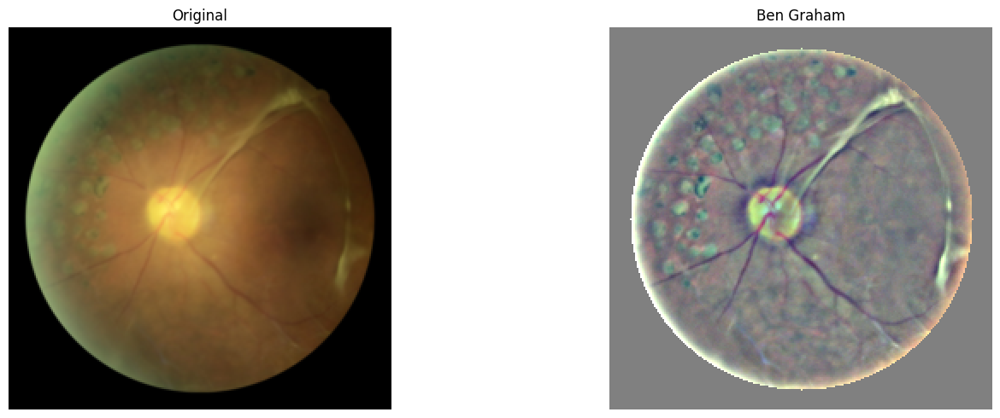

In [10]:
viz_class = 4

labels_flat = train_dataset.labels.flatten()
idx_sample = np.where(labels_flat == viz_class)[0][0]
sample = np.squeeze(train_dataset.imgs[idx_sample]).astype(np.uint8)

original = cv2.resize(sample, (224, 224))
bg = preprocess_ben_graham(sample, sigma=5)

fig, axes = plt.subplots(1, 2, figsize=(16, 5))
titles = ['Original', 'Ben Graham']
for ax, img, title in zip(axes, [original, bg], titles):
    ax.imshow(img)
    ax.set_title(title, fontsize=12)
    ax.axis('off')

plt.tight_layout()
plt.show()

Here, we can visualize, after selecting the class we want to show an example of, how Ben Graham's preprocessing enhances lesions in the retina fundus images.

### Preprocessing and save modified images

In [ ]:
splits = [
    ("train", train_dataset),
    ("val",   val_dataset),
    ("test",  test_dataset),
]

for split_name, dataset in splits:
    labels_flat = dataset.labels.flatten()
    class_counts: dict[int, int] = {}
    for i in tqdm(range(len(dataset)), desc=split_name):
        label = int(labels_flat[i])
        class_dir = os.path.join(PREPROCESSED_DIR, split_name, str(label))
        os.makedirs(class_dir, exist_ok=True)

        img = np.squeeze(dataset.imgs[i]).astype(np.uint8)
        proc = preprocess_ben_graham(img)

        class_counts[label] = class_counts.get(label, 0) + 1
        fname = f"{class_counts[label]:05d}.png"
        Image.fromarray(proc).save(os.path.join(class_dir, fname))

print(f"\nImages saved under {PREPROCESSED_DIR}/")

test: 100%|██████████| 400/400 [00:10<00:00, 39.70it/s]


Images saved under /content/preprocessed/


In [12]:
def load_preprocessed(split_name: str) -> tuple[np.ndarray, np.ndarray]:
    """
    Load saved preprocessed images and labels.
    
    Args:
        split_name (str): Name of the dataset split ('train', 'val', or 'test').
    Returns:
        Tuple[np.ndarray, np.ndarray]: A tuple containing:
            - imgs: A numpy array of shape (N, H, W, C) containing the preprocessed images.
            - labels: A numpy array of shape (N,) containing the corresponding labels for the images.
    """
    split_dir = os.path.join(PREPROCESSED_DIR, split_name)
    imgs, labels = [], []
    class_dirs = sorted(os.listdir(split_dir))
    for cls_dir in class_dirs:
        cls = int(cls_dir)
        img_folder = os.path.join(split_dir, cls_dir)
        for fname in sorted(os.listdir(img_folder), key=lambda x: int(x.split(".")[0])):
            fpath = os.path.join(img_folder, fname)
            img = cv2.imread(fpath)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            imgs.append(img)
            labels.append(cls)
    return np.stack(imgs), np.array(labels)

train_proc_imgs, train_proc_labels = load_preprocessed("train")
val_proc_imgs, val_proc_labels = load_preprocessed("val")
test_proc_imgs, test_proc_labels = load_preprocessed("test")

print(f"Train: {train_proc_imgs.shape} | labels={train_proc_labels.shape}")
print(f"Val: {val_proc_imgs.shape} | labels={val_proc_labels.shape}")
print(f"Test: {test_proc_imgs.shape} | labels={test_proc_labels.shape}")

Train: (1080, 224, 224, 3) | labels=(1080,)
Val: (120, 224, 224, 3) | labels=(120,)
Test: (400, 224, 224, 3) | labels=(400,)


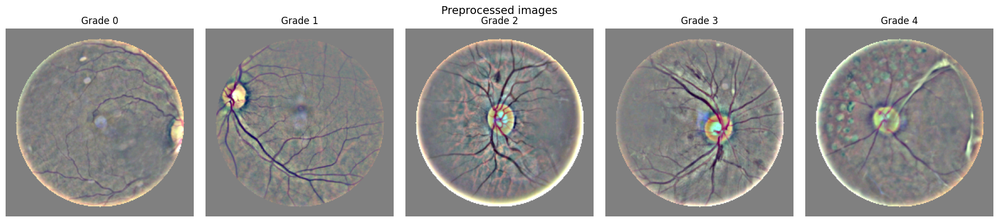

In [13]:
classes = np.unique(train_proc_labels.flatten())
fig, axes = plt.subplots(1, 5, figsize=(18, 4))

for idx, cls in enumerate(classes):
    labels_flat = train_proc_labels.flatten()
    sample_idx = np.where(labels_flat == cls)[0][0]
    sample = np.squeeze(train_proc_imgs[sample_idx]).astype(np.uint8)

    axes[idx].imshow(sample)
    axes[idx].set_title(f"Grade {int(cls)}", fontsize=12)
    axes[idx].axis("off")

fig.suptitle("Preprocessed images", fontsize=14)
plt.tight_layout()
plt.show()

Per-channel statistics (preprocessed training set):
 Channel     Mean      Std    Min    Max
       R   130.81    19.77      0    255
       G   129.74    19.15      0    255
       B   129.03    11.60      0    255

Mean: [0.31081352 0.31081352 0.31081352] std: [0.1828112  0.1761836  0.15619852]


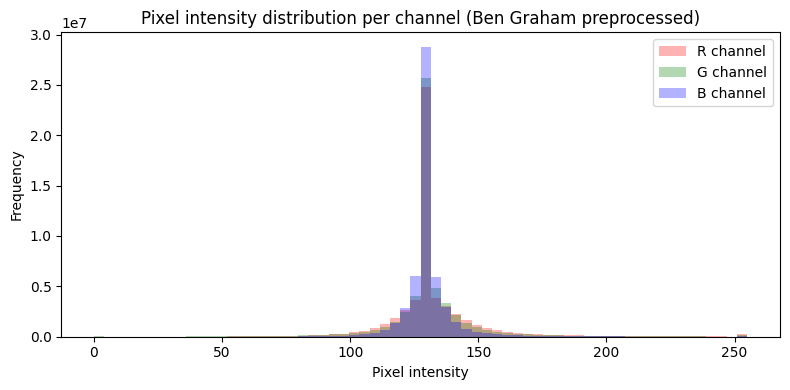

In [14]:
pixels = train_proc_imgs.reshape(-1, 3).astype(np.float32)

print("Per-channel statistics (preprocessed training set):")
print(f"{'Channel':>8} {'Mean':>8} {'Std':>8} {'Min':>6} {'Max':>6}")
for ch, name in enumerate(['R', 'G', 'B']):
    data = pixels[:, ch]
    print(f"{name:>8} {data.mean():>8.2f} {data.std():>8.2f} "
          f"{int(data.min()):>6} {int(data.max()):>6}")

MEAN = pixels.mean(axis=0) / 255.0
STD = pixels.std(axis=0) / 255.0

print(f"\nMean: {MEAN} std: {STD}")

fig, ax = plt.subplots(figsize=(8, 4))
colors = ['red', 'green', 'blue']
for ch, color in enumerate(colors):
    ax.hist(pixels[:, ch], bins=64, color=color, alpha=0.3,
            label=f'{["R","G","B"][ch]} channel')
ax.set_xlabel('Pixel intensity')
ax.set_ylabel('Frequency')
ax.set_title('Pixel intensity distribution per channel (Ben Graham preprocessed)')
ax.legend()
plt.tight_layout()
plt.show()

Computing mean and std on the training set, we can further use these exact values to normalize validation, test, and future inference data, projecting all inputs into a consistent feature space while strictly preventing data leakage.

In the cross-validation process, to avoid data leakage, these values will be computed on the actual training set generated at each fold.

## 5. Data augmentation

To avoid altering features that are clinically important for diagnosis, we apply only simple augmentations, such as random horizontal and vertical flips, and moderate affine transformations (including rotations, translations, and scaling). We avoid augmentations that could change the appearance of lesions or other key structures through drastic modifications to colors, brightness, or contrast. Instead, we apply only a slight color jitter to introduce more variation in the training set and mitigate overfitting, considering the small size of the dataset. Finally, we strictly avoid cropping or resizing operations that could remove important parts of the retina.

In [15]:
def make_train_transforms(mean: torch.Tensor, std: torch.Tensor) -> v2.Compose:
      return v2.Compose([
          v2.ToImage(),
          v2.RandomHorizontalFlip(p=0.5),
          v2.RandomVerticalFlip(p=0.5),
          v2.RandomAffine(degrees=90, translate=(0.1, 0.1)),
          v2.ColorJitter(brightness=0.2, contrast=0.2),
          v2.ToDtype(torch.float32, scale=True),
          v2.Normalize(mean, std),
      ])

def make_eval_transforms(mean: torch.Tensor, std: torch.Tensor) -> v2.Compose:
    return v2.Compose([
        v2.ToImage(),
        v2.ToDtype(torch.float32, scale=True),
        v2.Normalize(mean, std),
    ])

train_transforms = make_train_transforms(MEAN, STD)
eval_transforms = make_eval_transforms(MEAN, STD)

train_data = ImageFolder(root=os.path.join(PREPROCESSED_DIR, "train"), transform=train_transforms)
val_data = ImageFolder(root=os.path.join(PREPROCESSED_DIR, "val"),   transform=eval_transforms)
test_data = ImageFolder(root=os.path.join(PREPROCESSED_DIR, "test"),  transform=eval_transforms)
print(f"Train: {len(train_data)} samples, classes={train_data.classes}")
print(f"Val: {len(val_data)} samples, classes={val_data.classes}")
print(f"Test: {len(test_data)} samples, classes={test_data.classes}")


Train: 1080 samples, classes=['0', '1', '2', '3', '4']
Val: 120 samples, classes=['0', '1', '2', '3', '4']
Test: 400 samples, classes=['0', '1', '2', '3', '4']


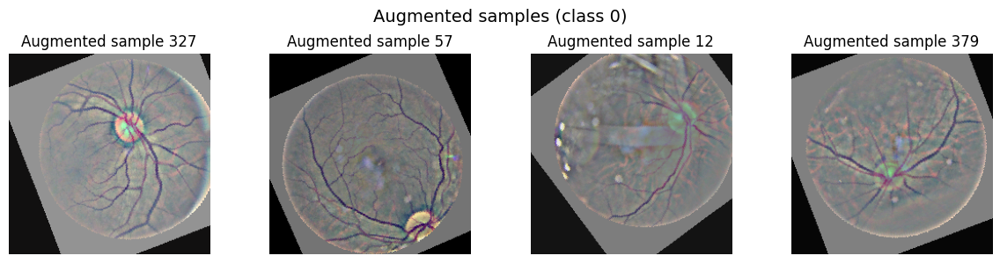

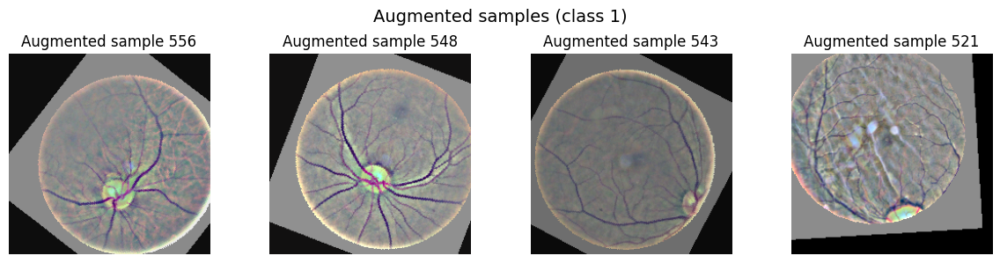

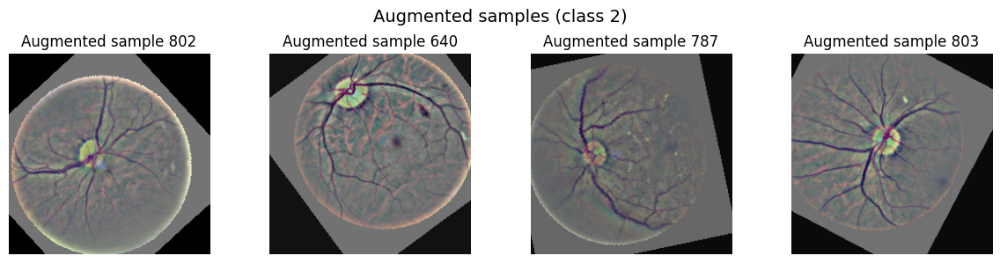

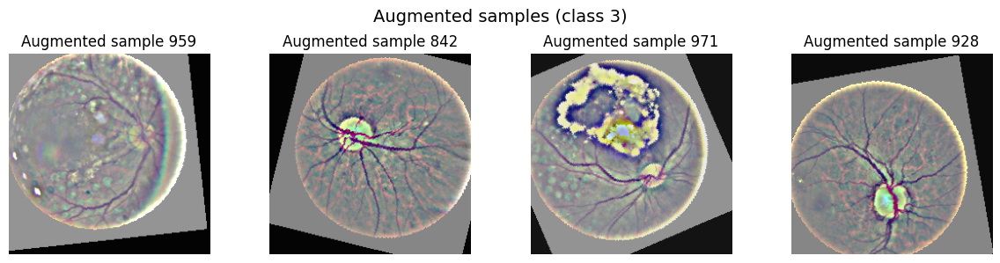

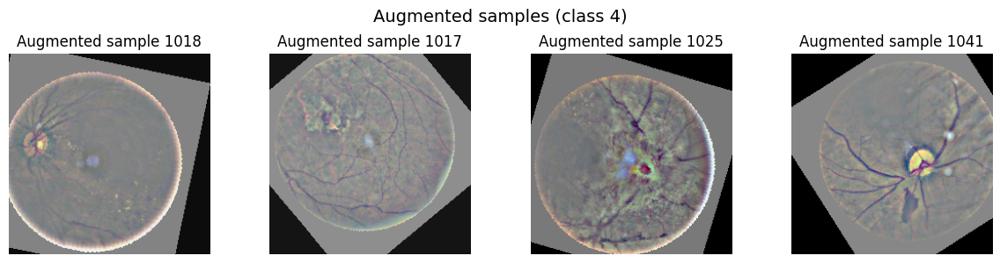

In [16]:
def plot_augmented_samples(dataset, class_idx, num_samples=4) -> None:
    """
    Plot augmented samples from the dataset for a specific class.

    Args:
        dataset (ImageFolder): The dataset containing the images.
        class_idx (int): The index of the class to visualize.
        num_samples (int): Number of augmented samples to display.
    """
    class_indices = [i for i, (_, label) in enumerate(dataset.samples) if label == class_idx]

    selected_indices = random.sample(class_indices, num_samples)

    plt.figure(figsize=(12, 3))

    for i, idx in enumerate(selected_indices):
        path, _ = dataset.samples[idx]
        img = Image.open(path).convert('RGB')
        img = make_train_transforms(MEAN, STD)(img)
        img = img.permute(1, 2, 0).numpy()
        img = (img * STD + MEAN) * 255.0
        img = np.clip(img, 0, 255).astype(np.uint8)

        plt.subplot(1, num_samples, i + 1)
        plt.imshow(img)
        plt.title(f'Augmented sample {selected_indices[i]}')
        plt.axis('off')

    plt.suptitle(f'Augmented samples (class {class_idx})', fontsize=14)
    plt.tight_layout()
    plt.show()

plot_augmented_samples(train_data, class_idx=0, num_samples=4)
plot_augmented_samples(train_data, class_idx=1, num_samples=4)
plot_augmented_samples(train_data, class_idx=2, num_samples=4)
plot_augmented_samples(train_data, class_idx=3, num_samples=4)
plot_augmented_samples(train_data, class_idx=4, num_samples=4)


Augmented samples from each class were visualized to illustrate the data the model will encounter during training. This confirms that the augmentations do not deviate significantly from the standard images preprocessed using Ben Graham's method.

## 6. Model architecture

The proposed architecture is a transfer-learning-based Convolutional Neural Network (CNN) built upon the **EfficientNetV2-RW-T** (`efficientnetv2_rw_t`) backbone.  Engineered to process $224 \times 224$ pixel medical imagery, the network incorporates flexible parameter-tuning protocols and adaptable output modules to handle multi-class grading tasks efficiently.

1. Feature Extraction Backbone

At the heart of the network lies the EfficientNetV2 topology, which sequences an initial stem convolution followed by a deep hierarchy of EdgeResidual and InvertedResidual mobile blocks. This design optimizes both parameter efficiency and representational capacity. As inputs propagate through the stages, feature channels scale up to 1024 while spatial dimensions are systematically downsampled, yielding a final activation map of $7 \times 7$ resolution before pooling.

2. Adaptable Training Regimes

To control how the network learns from target datasets, the architecture supports distinct optimization scopes managed via modular layer freezing:
* **Linear Probing (`strategy='linear_probing'`):** All backbone parameters are frozen (`requires_grad = False`), and only the final classification head is updated.
* **Partial Fine-Tuning (`strategy='partial_ft'`):** Selectively unlocks the deepest convolutional block alongside the head, enabling task-specific adaptation of high-level features while preserving low-level edge detectors.


3. Aggregation and Classification Heads

Following the convolutional stages, a **SelectAdaptivePool2d** layer (combining `AdaptiveAvgPool2d` and a `Flatten` operation) aggregates the final spatial dimensions of the backbone's feature maps are aggregated into a 1024-dimensional embedding vector. The final output stage accommodates two distinct training paradigms: standard multi-class projection via standard linear layers (`use_coral=False`) or ordinal-aware binary task decomposition via a custom CoralLayer (`use_coral=True`), seamlessly bridging the feature extractor to the chosen optimization objective.



### References:
* Tan, M., & Le, Q. V. (2021). EfficientNetV2: Smaller Models and Faster Training.





In [17]:
def get_model(num_classes=5, strategy='linear_probing', use_coral=False):
    """
    Constructs and configures the EfficientNetV2-RW-T classification model.

    Args:
        num_classes (int): The total number of target ordinal severity classes (default is 5).
        strategy (str): The optimization and training strategy to apply, such as 
            'linear_probing' or 'partial_ft' (default is 'linear_probing').
        use_coral (bool): If True, replaces the standard classification head with a 
            CORAL (Consistent Rank Logits) ordinal layer using (num_classes - 1) binary outputs; 
            otherwise, uses a standard linear output layer (default is False).

    Returns:
        torch.nn.Module: The configured neural network model moved to the designated device.
    """
    
    effective_classes = (num_classes - 1) if use_coral else num_classes
    
    model = timm.create_model('efficientnetv2_rw_t', pretrained=True, num_classes=effective_classes)
    model.num_classes = num_classes
    
    in_features = model.classifier.in_features if hasattr(model.classifier, 'in_features') else model.classifier[-1].in_features
    
    if use_coral:
        model.classifier = torch.nn.Sequential(
            torch.nn.Dropout(p=0.5),
            CoralLayer(size_in=in_features, num_classes=num_classes)
        )
    else:
        model.classifier = torch.nn.Sequential(
            torch.nn.Dropout(p=0.5),
            torch.nn.Linear(in_features, effective_classes)
        )
        
    return model.to(DEVICE)



def set_trainable_layers(model, strategy):
    """
    Configures the gradient propagation and layer freezing behavior based on the chosen training strategy.

    Args:
        model (torch.nn.Module): The neural network model whose layers are to be frozen or unfrozen.
        strategy (str): The training approach; accepts 'linear_probing' (freezing the entire 
            backbone and only training the classifier) or 'partial_ft' (unlocking the final 
            convolutional blocks alongside the classification head).
    """
    
    for param in model.parameters():
        param.requires_grad = False
    
    for param in model.classifier.parameters():
        param.requires_grad = True
        
    if strategy == 'partial_ft':

        for block in model.blocks[-1:]:
            for param in block.parameters():
                param.requires_grad = True
                 

In [19]:
model = get_model(num_classes=len(classes), use_coral=False).to(DEVICE)
summary(model, input_size=(1, 3, 224, 224), device=DEVICE)

Layer (type:depth-idx)                        Output Shape              Param #
EfficientNet                                  [1, 5]                    --
├─Conv2d: 1-1                                 [1, 24, 112, 112]         648
├─BatchNormAct2d: 1-2                         [1, 24, 112, 112]         48
│    └─Identity: 2-1                          [1, 24, 112, 112]         --
│    └─SiLU: 2-2                              [1, 24, 112, 112]         --
├─Sequential: 1-3                             [1, 208, 7, 7]            --
│    └─Sequential: 2-3                        [1, 24, 112, 112]         --
│    │    └─ConvBnAct: 3-1                    [1, 24, 112, 112]         5,232
│    │    └─ConvBnAct: 3-2                    [1, 24, 112, 112]         5,232
│    └─Sequential: 2-4                        [1, 40, 56, 56]           --
│    │    └─EdgeResidual: 3-3                 [1, 40, 56, 56]           24,848
│    │    └─EdgeResidual: 3-4                 [1, 40, 56, 56]           64,400
│    

In [21]:
model_coral = get_model(num_classes=len(classes), use_coral=True).to(DEVICE)
summary(model_coral, input_size=(1, 3, 224, 224), device=DEVICE)

Layer (type:depth-idx)                        Output Shape              Param #
EfficientNet                                  [1, 4]                    --
├─Conv2d: 1-1                                 [1, 24, 112, 112]         648
├─BatchNormAct2d: 1-2                         [1, 24, 112, 112]         48
│    └─Identity: 2-1                          [1, 24, 112, 112]         --
│    └─SiLU: 2-2                              [1, 24, 112, 112]         --
├─Sequential: 1-3                             [1, 208, 7, 7]            --
│    └─Sequential: 2-3                        [1, 24, 112, 112]         --
│    │    └─ConvBnAct: 3-1                    [1, 24, 112, 112]         5,232
│    │    └─ConvBnAct: 3-2                    [1, 24, 112, 112]         5,232
│    └─Sequential: 2-4                        [1, 40, 56, 56]           --
│    │    └─EdgeResidual: 3-3                 [1, 40, 56, 56]           24,848
│    │    └─EdgeResidual: 3-4                 [1, 40, 56, 56]           64,400
│    

In [ ]:
def worker_init_fn(worker_id: int) -> None:
    """
    Seed each DataLoader worker deterministically based on its ID.

    Args:
        worker_id (int): The ID of the DataLoader worker.
    """
    np.random.seed(SEED + worker_id)
    random.seed(SEED + worker_id)
    torch.manual_seed(SEED + worker_id)


class FolderDataset(Dataset):
    """
    PyTorch Dataset for loading images from a folder structure where each class has its own subdirectory.
    """

    def __init__(self, paths, targets, transform):
        self.paths = paths
        self.targets = targets
        self.transform = transform

    def __len__(self):
        """
        Returns the total number of samples in the dataset.
        """
        return len(self.paths)

    def __getitem__(self, idx):
        """
        Given an index, returns the corresponding image and its label.
        """
        img = Image.open(self.paths[idx]).convert("RGB")
        target = self.targets[idx]
        if self.transform:
            img = self.transform(img)
        return img, target


def train_epoch_ce(model: torch.nn.Module, loader: DataLoader, criterion: torch.nn.Module, optimizer: torch.optim.Optimizer) -> float:
    """
    Train one epoch with Cross-Entropy loss.

    Args:
        model (torch.nn.Module): The model to train.
        loader (DataLoader): DataLoader for the training data.
        criterion (torch.nn.Module): Loss function (CrossEntropyLoss).
        optimizer (torch.optim.Optimizer): Optimizer for updating model parameters.
    Returns:
        float: Average loss over the epoch.
    """
    model.train()
    total_loss = 0.0
    for x, y in loader:
        x = x.to(DEVICE)
        y = y.squeeze().long().to(DEVICE) 

        optimizer.zero_grad()
        logits = model(x)
        loss = criterion(logits, y)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * x.size(0)

    return total_loss / len(loader.dataset)


def validate_ce(model: torch.nn.Module, loader: DataLoader) -> tuple[np.ndarray, np.ndarray, np.ndarray, float]:
    """
    Evaluate CE model.

    Args:
        model (torch.nn.Module): The model to evaluate.
        loader (DataLoader): DataLoader for the validation data.
    Returns:
        tuple[np.ndarray, np.ndarray, np.ndarray, float]: Predicted labels, true labels, predicted probabilities, and average loss.
    """
    model.eval()
    total_loss = 0.0
    preds, labels, probs = [], [], []

    with torch.no_grad():
        for x, y in loader:
            x = x.to(DEVICE)
            y = y.squeeze().long().to(DEVICE)

            logits = model(x)

            batch_loss = F.cross_entropy(logits, y, reduction='sum').item()
            total_loss += batch_loss

            prob = torch.softmax(logits, dim=1)

            preds.extend(logits.argmax(dim=1).cpu().numpy())
            labels.extend(y.cpu().numpy())
            probs.append(prob.cpu().numpy())

    avg_loss = total_loss / len(loader.dataset)

    return (
        np.array(preds),
        np.array(labels),
        np.concatenate(probs, axis=0),
        avg_loss
    )


def train_epoch_coral(model: torch.nn.Module, loader: DataLoader, optimizer: torch.optim.Optimizer, importance_weights: torch.Tensor) -> float:
    """
    Train one epoch with CORAL loss.

    Args:
        model (torch.nn.Module): The model to train.
        loader (DataLoader): DataLoader for the training data.
        optimizer (torch.optim.Optimizer): Optimizer for updating model parameters.
        importance_weights (torch.Tensor): Importance weights for CORAL loss.

    Returns:
        float: Average loss over the epoch.
    """
    model.train()
    total_loss = 0.0
    for x, y in loader:
        x = x.to(DEVICE)
        y = y.squeeze().long().to(DEVICE)

        levels = levels_from_labelbatch(y, num_classes=model.num_classes).to(DEVICE)

        optimizer.zero_grad()
        logits = model(x)
        loss = coral_loss(logits, levels, importance_weights=importance_weights)
        loss.backward()
        optimizer.step()

        total_loss += loss.item() * x.size(0)

    return total_loss / len(loader.dataset)


def validate_coral(model: torch.nn.Module, loader: DataLoader, importance_weights: torch.Tensor) -> tuple[np.ndarray, np.ndarray, np.ndarray, float]:
    """
        Evaluate CORAL model on RetinaMNIST.
    
        Args:
            model (torch.nn.Module): The model to evaluate.
            loader (DataLoader): DataLoader for the validation data.
            importance_weights (torch.Tensor): Importance weights for CORAL loss.
        Returns:
            tuple[np.ndarray, np.ndarray, np.ndarray, float]: Predicted labels, true labels, predicted probabilities, and average loss.
        """
    model.eval()
    total_loss = 0.0
    preds, labels, probs = [], [], []

    with torch.no_grad():
        for x, y in loader:
            x = x.to(DEVICE)
            y = y.squeeze().long().to(DEVICE)

            logits = model(x)
            levels = levels_from_labelbatch(y, num_classes=model.num_classes).to(DEVICE)

            batch_loss = coral_loss(logits, levels, importance_weights=importance_weights, reduction='sum').item()
            total_loss += batch_loss

            probas = torch.sigmoid(logits)

            preds.extend(proba_to_label(probas).cpu().numpy())
            labels.extend(y.cpu().numpy())

            p_cls_0 = 1.0 - probas[:, :1]
            p_cls_mid = probas[:, :-1] - probas[:, 1:]
            p_cls_last = probas[:, -1:]

            class_probs = torch.cat([p_cls_0, p_cls_mid, p_cls_last], dim=1)
            probs.append(class_probs.cpu().numpy())

    avg_loss = total_loss / len(loader.dataset)

    return (
        np.array(preds),
        np.array(labels),
        np.concatenate(probs, axis=0),
        avg_loss
    )


def report_metrics(labels: np.ndarray, preds: np.ndarray, probs: np.ndarray, split_name: str = "val", title: str = "Report metrics") -> np.ndarray:
    """
    Report metrics for a given split.

    Args:
        labels: True labels (numpy array).
        preds: Predicted labels (numpy array).
        probs: Predicted probabilities (numpy array).
        split_name: Name of the dataset split (default: "val").
        title: Title for the confusion matrix plot (default: "Report metrics").
    Returns:
        cm_norm: Normalized confusion matrix (numpy array).
    """
    print(f"\n{split_name} set results:")
    print(f"\tMacro F1: {f1_score(labels, preds, average='macro'):.4f}")
    print(f"\tQWK: {cohen_kappa_score(labels, preds, weights='quadratic'):.4f}")
    print(f"\tAccuracy: {accuracy_score(labels, preds):.4f}")
    print(f"\tAUC: {roc_auc_score(labels, probs, multi_class='ovr', average='macro'):.4f}")

    report = classification_report(
        labels,
        preds,
        target_names=[f"Grade {i}" for i in range(5)],
        output_dict=True,
        zero_division=0
    )

    print("\nPer-class metrics:")
    for cls in range(5):
        cls_key = f"Grade {cls}"
        prec = report[cls_key]['precision']
        rec = report[cls_key]['recall']
        f1_c = report[cls_key]['f1-score']
        print(f"\tGrade {cls}: precision={prec:.3f}\trecall={rec:.3f}\tF1={f1_c:.3f}")

    cm_norm = confusion_matrix(labels, preds, normalize='true')

    fig, ax = plt.subplots(figsize=(6, 6))
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_norm, display_labels=[f'Grade {i}' for i in range(5)])
    disp.plot(cmap=plt.cm.Blues, values_format='.2f', ax=ax)

    plt.title(title)
    plt.show()

    return cm_norm


def plot_roc(labels: np.ndarray, probs: np.ndarray, title: str = "ROC curves") -> None:
    """
    Plot ROC curves for each class and display AUC.

    Args:
        labels: True labels (numpy array).
        probs: Predicted probabilities (numpy array).
        title: Title for the ROC plot (default: "ROC curves").
    """
    fig, ax = plt.subplots(figsize=(7, 5))
    for i in range(5):
        fpr, tpr, _ = roc_curve((labels == i).astype(int), probs[:, i])
        a = sklearn.metrics.auc(fpr, tpr)
        ax.plot(fpr, tpr, label=f'Grade {i} (AUC = {a:.3f})')

    ax.plot([0, 1], [0, 1], 'k--', alpha=0.5)
    ax.set_xlabel('False positive rate')
    ax.set_ylabel('True positive rate')
    ax.legend()

    plt.title(title)
    plt.tight_layout(rect=[0, 0.03, 1, 1])
    plt.show()


def train_ce(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    epochs: int = 50,
    class_weights_data: Optional[torch.Tensor] = None,
    early_stopping: Optional[int] = 10,
    plot: bool = False,
    strategy: str = 'linear_probing'
):
    """
    Full CE training loop with early stopping.

    Args:
        model: nn.Module (already on DEVICE).
        train_loader: DataLoader for training.
        val_loader: DataLoader for validation (early stopping).
        epochs: max epochs.
        class_weights_data: tensor of shape (5,) or None (unweighted).
        early_stopping: stop if no improvement in AUC for this many epochs.
        plot: if True, show loss/acc/AUC curves + ROC on test.
        strategy: training strategy ('linear_probing' or 'partial_ft').

    Returns:
        Tuple (model, metrics, history).
    """
    criterion = (
        nn.CrossEntropyLoss(weight=class_weights_data) if class_weights_data is not None else nn.CrossEntropyLoss()
    )
    if strategy == 'linear_probing':
        optimizer = torch.optim.AdamW(model.classifier.parameters(), lr=1e-3, weight_decay=1e-3)
    elif strategy == 'partial_ft':
        classifier_params = []
        backbone_params = []
        
        for name, param in model.named_parameters():
            if not param.requires_grad:
                continue
            if 'classifier' in name:
                classifier_params.append(param)
            else:
                backbone_params.append(param)
                
        optimizer = torch.optim.AdamW([
            {'params': backbone_params, 'lr': 2e-5},  
            {'params': classifier_params, 'lr': 1e-4}   
        ], weight_decay=5e-2)   
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
    optimizer, 
    T_max=EPOCHS, 
    eta_min=1e-6)


    train_losses, val_losses, accs, aucs = [], [], [], []
    best_auc, best_state, stale = 0.0, None, 0

    for epoch in range(1, epochs + 1):
        tr_loss = train_epoch_ce(model, train_loader, criterion, optimizer)
        preds, labels, probs, vl_loss = validate_ce(model, val_loader)

        acc = accuracy_score(labels, preds)
        qwk = cohen_kappa_score(labels, preds, weights="quadratic")
        auc = roc_auc_score(labels, probs, multi_class="ovr", average="macro")

        train_losses.append(tr_loss)
        val_losses.append(vl_loss)
        accs.append(acc)
        aucs.append(auc)

        if auc > best_auc:
            best_auc = auc
            best_state = copy.deepcopy(model.state_dict())
            stale = 0
        else:
            stale += 1

        scheduler.step()

        if epoch == 1 or epoch % 5 == 0:
            lr = optimizer.param_groups[0]["lr"]
            print(
                f"\tEpoch {epoch:2d}/{epochs} | LR: {lr:.2e} | Train loss: {tr_loss:.4f} | Val loss: {vl_loss:.4f} | Acc: {acc:.4f} | QWK: {qwk:.4f} | AUC: {auc:.4f}"
            )
        if early_stopping is not None and stale >= early_stopping:
            print(f"\tEarly stopping at epoch {epoch}")
            break

    model.load_state_dict(best_state)
    model.eval()

    if plot:
        _, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        ax1.plot(train_losses, label="Train loss")
        ax1.plot(val_losses, label="Val loss")
        ax1.set_xlabel("Epoch")
        ax1.set_ylabel("Loss")
        ax1.legend()
        ax2.plot(accs, label="Accuracy")
        ax2.plot(aucs, label="AUC")
        ax2.set_xlabel("Epoch")
        ax2.legend()
        plt.suptitle(f"Training curves - CE {strategy}")
        plt.tight_layout()
        plt.show()

    val_preds, val_labels, val_probs, _ = validate_ce(model, val_loader)
    report_metrics(val_labels, val_preds, val_probs, "val", f"Confusion matrix (val) - CE {strategy}")

    return (
        model,
        dict(val_preds=val_preds, val_labels=val_labels, val_probs=val_probs),
        dict(train_losses=train_losses, val_losses=val_losses, accs=accs, aucs=aucs),
    )


def compute_coral_importance(labels: np.ndarray) -> torch.Tensor:
    """
    CORAL importance weights (Cao et al. 2019 Eq.7) from a label array.

    Args:
        labels: numpy array of shape (N,) with integer labels in [0, 4].
    Returns:
        torch.Tensor of shape (4,) with normalized importance weights for CORAL loss.
    """
    N = len(labels)
    counts = np.bincount(labels, minlength=5)
    cum_pos = np.cumsum(counts[::-1])[::-1][1:]  # S_k for k=0..3
    M = np.maximum(cum_pos, N - cum_pos)
    sqrt_M = np.sqrt(M)
    return torch.tensor(sqrt_M / sqrt_M.max(), dtype=torch.float32, device=DEVICE)


def train_coral(
    model: nn.Module,
    train_loader: DataLoader,
    val_loader: DataLoader,
    epochs: int = 50,
    importance_weights: Optional[torch.Tensor] = None,
    early_stopping: Optional[int] = 10,
    plot: bool = False,
    strategy: str = 'linear_probing'
):
    """
    Full CORAL training loop with early stopping.

    Args:
        model: nn.Module (already on DEVICE).
        train_loader: DataLoader for training.
        val_loader: DataLoader for validation (early stopping).
        epochs: max epochs.
        importance_weights: tensor of shape (4,) or None (unweighted).
        early_stopping: stop if no improvement in AUC for this many epochs.
        plot: if True, show loss/acc/AUC curves + ROC on test.
        strategy: training strategy ('linear_probing' or 'partial_ft').
    Returns:
        Tuple (model, metrics, history).
    """
    if strategy == 'linear_probing':
        optimizer = torch.optim.AdamW(model.classifier.parameters(), lr=3e-4, weight_decay=1e-4)
    elif strategy == 'partial_ft':
        classifier_params = []
        backbone_params = []
        
        for name, param in model.named_parameters():
            if not param.requires_grad:
                continue
            if 'classifier' in name:
                classifier_params.append(param)
            else:
                backbone_params.append(param)
                
        optimizer = torch.optim.AdamW([
            {'params': backbone_params, 'lr': 2e-5},  
            {'params': classifier_params, 'lr': 1e-4}   
        ], weight_decay=1e-4)
        
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)

    train_losses, val_losses, accs, aucs = [], [], [], []
    best_auc, best_state, stale = 0.0, None, 0

    for epoch in range(1, epochs + 1):
        tr_loss = train_epoch_coral(model, train_loader, optimizer, importance_weights)
        preds, labels, probs, vl_loss = validate_coral(model, val_loader, importance_weights)

        acc = accuracy_score(labels, preds)
        qwk = cohen_kappa_score(labels, preds, weights="quadratic")
        auc = roc_auc_score(labels, probs, multi_class="ovr", average="macro")

        train_losses.append(tr_loss)
        val_losses.append(vl_loss)
        accs.append(acc)
        aucs.append(auc)

        if auc > best_auc:
            best_auc = auc
            best_state = copy.deepcopy(model.state_dict())
            stale = 0
        else:
            stale += 1

        scheduler.step()

        if epoch == 1 or epoch % 5 == 0:
            lr = optimizer.param_groups[0]["lr"]
            print(
                f"\tEpoch {epoch:2d}/{epochs} | LR: {lr:.2e} | Train loss: {tr_loss:.4f} | Val loss: {vl_loss:.4f} | Acc: {acc:.4f} | QWK: {qwk:.4f} | AUC: {auc:.4f}"
            )
        if early_stopping is not None and stale >= early_stopping:
            print(f"\tEarly stopping at epoch {epoch}")
            break

    model.load_state_dict(best_state)
    model.eval()

    if plot:
        _, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
        ax1.plot(train_losses, label="Train loss")
        ax1.plot(val_losses, label="Val loss")
        ax1.set_xlabel("Epoch")
        ax1.set_ylabel("Loss")
        ax1.legend()
        ax2.plot(accs, label="Accuracy")
        ax2.plot(aucs, label="AUC")
        ax2.set_xlabel("Epoch")
        ax2.legend()
        plt.suptitle(f"Training curves - CORAL {strategy}")
        plt.tight_layout()
        plt.show()

    val_preds, val_labels, val_probs, _ = validate_coral(model, val_loader, importance_weights)
    report_metrics(val_labels, val_preds, val_probs, "val", f"Confusion matrix (val) - CORAL {strategy}")

    return (
        model,
        dict(val_preds=val_preds, val_labels=val_labels, val_probs=val_probs),
        dict(train_losses=train_losses, val_losses=val_losses, accs=accs, aucs=aucs),
    )


all_paths = [p for p, _ in train_data.imgs]
all_targets = np.array(train_data.targets)

N_FOLDS, EPOCHS, BATCH_SIZE = 5, 50, 32
NUM_CLASSES=5

### Optimization

All models are trained using the AdamW optimizer paired with a Cosine Annealing scheduler (decaying to a minimum learning rate of $10^{-6}$ over a maximum of 50 epochs). Training is regularized with early stopping based on validation AUC (patience of 10 epochs), which typically halts execution well before the upper bound. A uniform batch size of 32 is maintained across experiments for $224 \times 224$ RGB inputs. 

The optimization strategy dynamically adapts depending on the chosen fine-tuning regime:
* **Linear Probing:** Updates are restricted exclusively to the classifier parameters using an AdamW configuration with a learning rate of $10^{-3}$ and weight decay of $10^{-3}$.
* **Partial Fine-Tuning:** Employs differential learning rates and stronger regularization via parameter groups. Unfrozen backbone layers are updated with a conservative learning rate of $2 \times 10^{-5}$, while the classifier head uses a higher learning rate of $10^{-4}$, both combined with an increased weight decay of $10^{-2}$.

Structural regularization: To prevent overfitting and enhance model generalizability during training, a dropout layer with a probability of $0.5$ ($p = 0.5$) is integrated immediately prior to the classification head across all configurations

### Loss functions

Regarding loss functions, this project explores two distinct approaches for training the model:
- **Cross-Entropy (CE) loss**, which treats the problem as a standard multi-class classification task, and
- **CORAL loss**, which is specifically designed for ordinal regression tasks, taking into account the ordered nature of the DR grades. The CORAL loss penalizes predictions that are further away from the true class more heavily than those that are closer, thus encouraging the model to respect the ordinal relationships between classes

By exploiting the same architecture, we can directly compare the performance of these two loss functions in the context of DR grading. Because of the different loss functions, only the final classification head is different (different number of output nodes), while the convolutional backbone remains the same, with SE, features fusion and bottleneck compression modules employed.

### Metrics

During the training and evaluation phases, we employ a partial common set of metrics to assess the model's performance. These include:
- **Accuracy**: Measures the overall correctness of the model's predictions across all classes.
- **Area Under the Curve (AUC)**: Evaluates the model's ability to distinguish between classes, particularly useful in imbalanced datasets.
- **Quadratic Weighted Kappa (QWK)**: Specifically designed for ordinal classification tasks, QWK assesses the agreement between predicted and true labels while considering the severity of misclassifications. It penalizes predictions that are further away from the true class more heavily than those that are closer, making it particularly suitable for evaluating DR grading models.

For the evaluation phase, we also compute the classification report, which provides a detailed breakdown of precision, recall, and F1-score for each class. This allows for a more granular understanding of the model's performance across different DR grades, highlighting areas where the model excels or may require further improvement.

Finally, the normalized confusion matrix is also computed, which provides a visual representation of the model's performance across all classes, allowing for easy identification of patterns in misclassifications and areas where the model may need improvement.

## 7. Linear probing: cross-entropy model CV and final training


Fold 1/5
	Class weights:	 {0: np.float32(0.445), 1: np.float32(1.678), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 1.5869 | Val loss: 1.5306 | Acc: 0.3241 | QWK: 0.3454 | AUC: 0.6905
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.3515 | Val loss: 1.3525 | Acc: 0.4537 | QWK: 0.4965 | AUC: 0.7444
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.2548 | Val loss: 1.2630 | Acc: 0.4722 | QWK: 0.5213 | AUC: 0.7623
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.2361 | Val loss: 1.2551 | Acc: 0.4769 | QWK: 0.5139 | AUC: 0.7658
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.2059 | Val loss: 1.2324 | Acc: 0.5185 | QWK: 0.5416 | AUC: 0.7668
	Early stopping at epoch 22

val set results:
	Macro F1: 0.4219
	QWK: 0.5379
	Accuracy: 0.4954
	AUC: 0.7701

Per-class metrics:
	Grade 0: precision=0.829	recall=0.592	F1=0.690
	Grade 1: precision=0.256	recall=0.400	F1=0.312
	Grade 2: precision=0.314	recall=0.268	F1=0.289
	Grade 3: precision=0.426	recall=0.590	F1

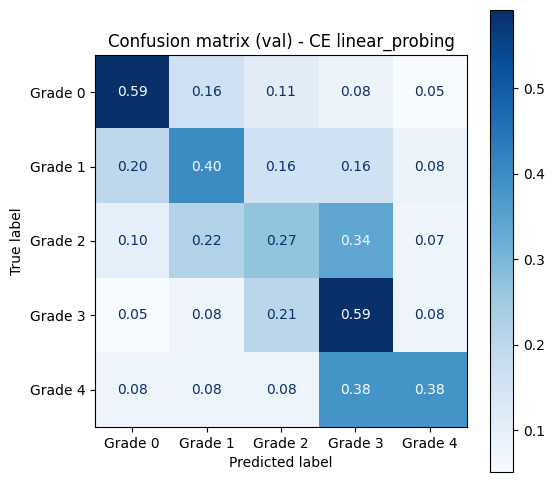


Fold 2/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 1.5794 | Val loss: 1.5023 | Acc: 0.3750 | QWK: 0.2872 | AUC: 0.6734
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.3387 | Val loss: 1.3347 | Acc: 0.4769 | QWK: 0.4579 | AUC: 0.7597
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.2506 | Val loss: 1.2852 | Acc: 0.4630 | QWK: 0.4825 | AUC: 0.7780
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.1899 | Val loss: 1.2659 | Acc: 0.4907 | QWK: 0.4763 | AUC: 0.7777
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.1720 | Val loss: 1.2178 | Acc: 0.5000 | QWK: 0.5119 | AUC: 0.7814
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.1607 | Val loss: 1.2435 | Acc: 0.4861 | QWK: 0.5128 | AUC: 0.7743
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.1312 | Val loss: 1.2452 | Acc: 0.4676 | QWK: 0.5003 | AUC: 0.7786
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.1362 | Val loss: 1.2390 | Acc: 0.4769 | QWK: 0.48

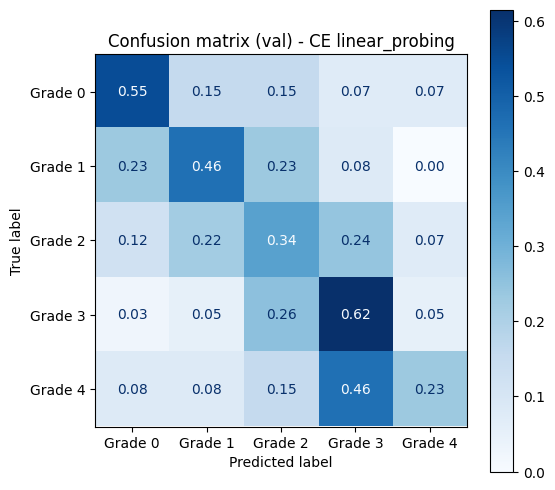


Fold 3/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 1.5849 | Val loss: 1.4971 | Acc: 0.4676 | QWK: 0.5331 | AUC: 0.7139
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.3762 | Val loss: 1.3196 | Acc: 0.5509 | QWK: 0.6009 | AUC: 0.7725
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.2577 | Val loss: 1.2761 | Acc: 0.5278 | QWK: 0.6223 | AUC: 0.7871
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.2153 | Val loss: 1.2598 | Acc: 0.5185 | QWK: 0.5974 | AUC: 0.7812
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.2208 | Val loss: 1.2348 | Acc: 0.5278 | QWK: 0.6122 | AUC: 0.7874
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.1940 | Val loss: 1.2169 | Acc: 0.5185 | QWK: 0.6322 | AUC: 0.7875
	Early stopping at epoch 28

val set results:
	Macro F1: 0.4757
	QWK: 0.6159
	Accuracy: 0.5324
	AUC: 0.7913

Per-class metrics:
	Grade 0: precision=0.873	recall=0.639	F1=0.738
	Grade 1: precision=0.282	r

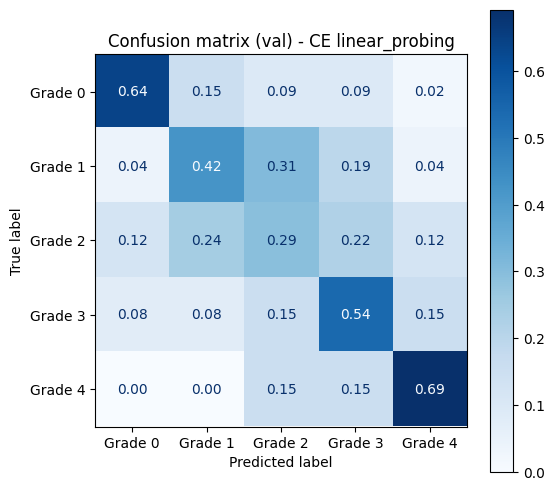


Fold 4/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 1.5915 | Val loss: 1.5099 | Acc: 0.3750 | QWK: 0.3714 | AUC: 0.6395
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.3561 | Val loss: 1.3291 | Acc: 0.4954 | QWK: 0.5393 | AUC: 0.7358
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.2591 | Val loss: 1.2357 | Acc: 0.5370 | QWK: 0.5994 | AUC: 0.7703
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.2246 | Val loss: 1.2504 | Acc: 0.5000 | QWK: 0.5723 | AUC: 0.7747
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.1897 | Val loss: 1.2260 | Acc: 0.5046 | QWK: 0.5739 | AUC: 0.7849
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.1779 | Val loss: 1.2076 | Acc: 0.4907 | QWK: 0.5633 | AUC: 0.7867
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.1584 | Val loss: 1.2423 | Acc: 0.4907 | QWK: 0.5865 | AUC: 0.7829
	Early stopping at epoch 33

val set results:
	Macro F1: 0.4040
	QWK: 0.5693
	Accuracy: 0.490

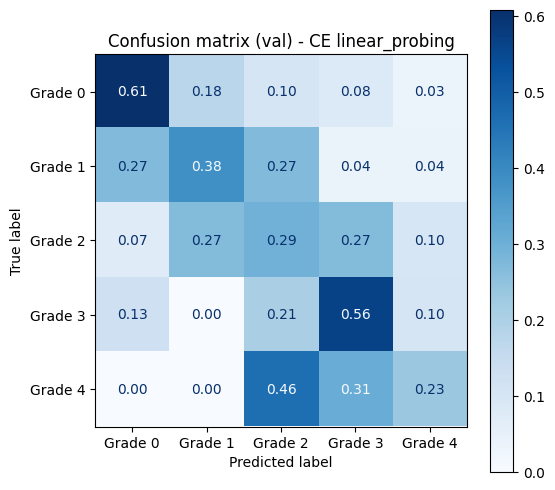


Fold 5/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.678), 2: np.float32(1.054), 3: np.float32(1.108), 4: np.float32(3.323)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 1.6021 | Val loss: 1.5003 | Acc: 0.4352 | QWK: 0.3817 | AUC: 0.6822
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.3417 | Val loss: 1.3436 | Acc: 0.4676 | QWK: 0.4734 | AUC: 0.7533
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.2664 | Val loss: 1.2525 | Acc: 0.5093 | QWK: 0.5734 | AUC: 0.7767
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.2423 | Val loss: 1.2213 | Acc: 0.5231 | QWK: 0.5883 | AUC: 0.7901
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.1881 | Val loss: 1.2095 | Acc: 0.5093 | QWK: 0.5799 | AUC: 0.7981
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.1585 | Val loss: 1.2076 | Acc: 0.5278 | QWK: 0.5847 | AUC: 0.8028
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.1513 | Val loss: 1.1958 | Acc: 0.5370 | QWK: 0.5932 | AUC: 0.8020
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.1195 | Val loss: 1.2041 | Acc: 0.5324 | QWK: 0.6

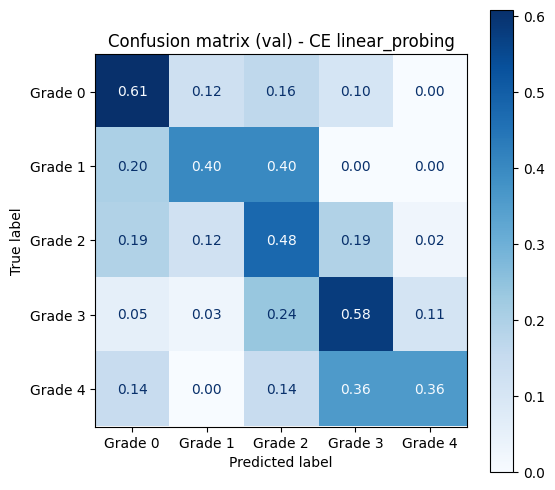


Results (CE linear probing, 5-fold CV):
	Accuracy: 0.5093 +/- 0.0209
	QWK: 0.5640 +/- 0.0394
	AUC: 0.7887 +/- 0.0120


In [ ]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'linear_probing' 
use_coral = False         

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)

fold_results_ce = []


for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(all_targets)), all_targets), 1):
    print(f"\nFold {fold}/{N_FOLDS}")
    
    classes = np.unique(all_targets[train_idx])
    class_weights = compute_class_weight('balanced', classes=classes, y=all_targets[train_idx])
    w = torch.tensor(class_weights, dtype=torch.float32, device=DEVICE)
    print(f"\tClass weights:\t", dict(zip(classes.tolist(), np.round(w.cpu().numpy(), 3))))

    train_fold = FolderDataset([all_paths[i] for i in train_idx], all_targets[train_idx], train_transforms)
    train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    val_fold   = FolderDataset([all_paths[i] for i in val_idx],   all_targets[val_idx],   eval_transforms)
    val_loader   = DataLoader(val_fold,   BATCH_SIZE, shuffle=False,
                              worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    model = get_model(num_classes=NUM_CLASSES, strategy=strategy, use_coral=use_coral)
    set_trainable_layers(model, strategy)
    fold_model, fold_metrics, _ = train_ce(model, train_loader, val_loader,
            epochs=EPOCHS, class_weights_data=w,strategy=strategy)
    acc = accuracy_score(fold_metrics['val_labels'], fold_metrics['val_preds'])
    qwk = cohen_kappa_score(fold_metrics['val_labels'], fold_metrics['val_preds'], weights='quadratic')
    auc = roc_auc_score(fold_metrics['val_labels'], fold_metrics['val_probs'], multi_class='ovr', average='macro')
    fold_results_ce.append({'acc': acc, 'qwk': qwk, 'auc': auc})

accs_ce = [r['acc'] for r in fold_results_ce]
qwks_ce = [r['qwk'] for r in fold_results_ce]
aucs_ce = [r['auc'] for r in fold_results_ce]

print(f"\nResults (CE linear probing, {N_FOLDS}-fold CV):")
print(f"\tAccuracy: {np.mean(accs_ce):.4f} +/- {np.std(accs_ce):.4f}")
print(f"\tQWK: {np.mean(qwks_ce):.4f} +/- {np.std(qwks_ce):.4f}")
print(f"\tAUC: {np.mean(aucs_ce):.4f} +/- {np.std(aucs_ce):.4f}")

### Training on the full training set

	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.688), 2: np.float32(1.049), 3: np.float32(1.113), 4: np.float32(3.273)}
	Epoch  1/50 | LR: 9.99e-04 | Train loss: 1.5784 | Val loss: 1.4768 | Acc: 0.4333 | QWK: 0.4006 | AUC: 0.6469
	Epoch  5/50 | LR: 9.76e-04 | Train loss: 1.3215 | Val loss: 1.3037 | Acc: 0.5083 | QWK: 0.5442 | AUC: 0.7334
	Epoch 10/50 | LR: 9.05e-04 | Train loss: 1.2407 | Val loss: 1.3007 | Acc: 0.5167 | QWK: 0.5165 | AUC: 0.7388
	Epoch 15/50 | LR: 7.94e-04 | Train loss: 1.2116 | Val loss: 1.2437 | Acc: 0.4750 | QWK: 0.5245 | AUC: 0.7495
	Epoch 20/50 | LR: 6.55e-04 | Train loss: 1.1513 | Val loss: 1.2427 | Acc: 0.5167 | QWK: 0.5601 | AUC: 0.7501
	Epoch 25/50 | LR: 5.00e-04 | Train loss: 1.1661 | Val loss: 1.2540 | Acc: 0.5083 | QWK: 0.5527 | AUC: 0.7522
	Epoch 30/50 | LR: 3.46e-04 | Train loss: 1.1538 | Val loss: 1.2539 | Acc: 0.5417 | QWK: 0.5685 | AUC: 0.7501
	Epoch 35/50 | LR: 2.07e-04 | Train loss: 1.1932 | Val loss: 1.2594 | Acc: 0.5083 | QWK: 0.5364 | AUC:

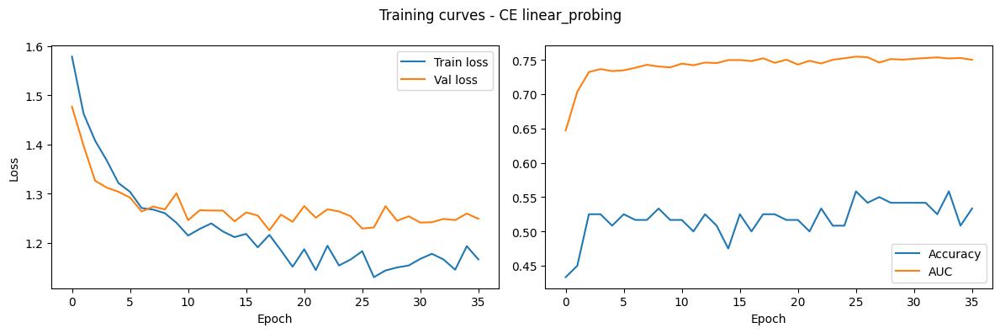


val set results:
	Macro F1: 0.4402
	QWK: 0.5643
	Accuracy: 0.5583
	AUC: 0.7545

Per-class metrics:
	Grade 0: precision=0.914	recall=0.593	F1=0.719
	Grade 1: precision=0.214	recall=0.500	F1=0.300
	Grade 2: precision=0.500	recall=0.500	F1=0.500
	Grade 3: precision=0.625	recall=0.750	F1=0.682
	Grade 4: precision=0.000	recall=0.000	F1=0.000


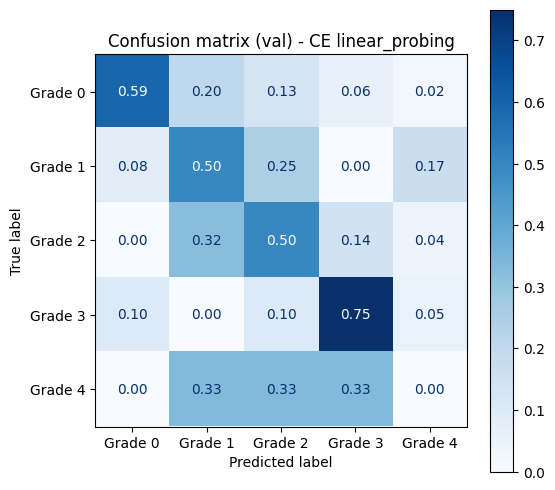

In [20]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'linear_probing' 
use_coral = False         

    
classes = np.unique(all_targets)
class_weights = compute_class_weight('balanced', classes=classes, y=all_targets)
w = torch.tensor(class_weights, dtype=torch.float32, device=DEVICE)
print(f"\tClass weights:\t", dict(zip(classes.tolist(), np.round(w.cpu().numpy(), 3))))

train_fold = FolderDataset(all_paths, all_targets, train_transforms)
train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

val_loader   = DataLoader(val_data,   BATCH_SIZE, shuffle=False,
                            worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

model_ce_LP = get_model(num_classes=NUM_CLASSES, strategy=strategy, use_coral=use_coral)
set_trainable_layers(model_ce_LP, strategy)

model_ce_LP, metrics_ce_LP, history_ce_LP = train_ce(model_ce_LP, train_loader, val_loader,
        epochs=EPOCHS, class_weights_data=w, plot=True, strategy=strategy)

## 8. Linear probing: CORAL model CV and final training


Fold 1/5
	CORAL importance weights: [0.7661134 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 3.00e-04 | Train loss: 2.4441 | Val loss: 2.3319 | Acc: 0.1806 | QWK: 0.1549 | AUC: 0.5689
	Epoch  5/50 | LR: 2.93e-04 | Train loss: 1.8471 | Val loss: 1.8747 | Acc: 0.3935 | QWK: 0.3379 | AUC: 0.6393
	Epoch 10/50 | LR: 2.71e-04 | Train loss: 1.7530 | Val loss: 1.7801 | Acc: 0.4444 | QWK: 0.4177 | AUC: 0.6764
	Epoch 15/50 | LR: 2.38e-04 | Train loss: 1.6851 | Val loss: 1.7211 | Acc: 0.4537 | QWK: 0.4638 | AUC: 0.6949
	Epoch 20/50 | LR: 1.97e-04 | Train loss: 1.6667 | Val loss: 1.6825 | Acc: 0.4583 | QWK: 0.4710 | AUC: 0.7026
	Epoch 25/50 | LR: 1.50e-04 | Train loss: 1.6191 | Val loss: 1.6639 | Acc: 0.4398 | QWK: 0.4977 | AUC: 0.7057
	Epoch 30/50 | LR: 1.04e-04 | Train loss: 1.5962 | Val loss: 1.6287 | Acc: 0.4630 | QWK: 0.5052 | AUC: 0.7131
	Epoch 35/50 | LR: 6.26e-05 | Train loss: 1.5903 | Val loss: 1.6266 | Acc: 0.4583 | QWK: 0.5304 | AUC: 0.7141
	Epoch 40/50 | LR: 2.96e-05 | Train loss:

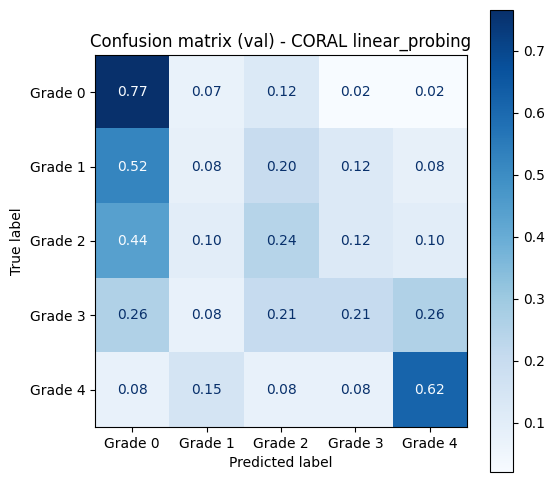


Fold 2/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 3.00e-04 | Train loss: 2.3275 | Val loss: 2.2595 | Acc: 0.1852 | QWK: 0.0898 | AUC: 0.5663
	Epoch  5/50 | LR: 2.93e-04 | Train loss: 1.8567 | Val loss: 1.9586 | Acc: 0.3657 | QWK: 0.2506 | AUC: 0.5596
	Epoch 10/50 | LR: 2.71e-04 | Train loss: 1.7598 | Val loss: 1.8737 | Acc: 0.3796 | QWK: 0.3753 | AUC: 0.5974
	Epoch 15/50 | LR: 2.38e-04 | Train loss: 1.6954 | Val loss: 1.8194 | Acc: 0.4028 | QWK: 0.3947 | AUC: 0.6193
	Epoch 20/50 | LR: 1.97e-04 | Train loss: 1.6345 | Val loss: 1.7847 | Acc: 0.4167 | QWK: 0.4107 | AUC: 0.6264
	Epoch 25/50 | LR: 1.50e-04 | Train loss: 1.6107 | Val loss: 1.7591 | Acc: 0.4074 | QWK: 0.4373 | AUC: 0.6351
	Epoch 30/50 | LR: 1.04e-04 | Train loss: 1.5872 | Val loss: 1.7408 | Acc: 0.4028 | QWK: 0.4444 | AUC: 0.6394
	Epoch 35/50 | LR: 6.26e-05 | Train loss: 1.5980 | Val loss: 1.7290 | Acc: 0.4167 | QWK: 0.4693 | AUC: 0.6461
	Epoch 40/50 | LR: 2.96e-05 | Train loss:

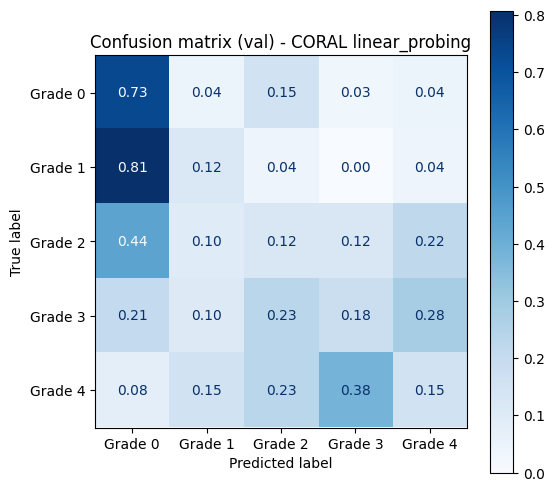


Fold 3/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 3.00e-04 | Train loss: 2.5362 | Val loss: 2.4813 | Acc: 0.1111 | QWK: 0.0474 | AUC: 0.5238
	Epoch  5/50 | LR: 2.93e-04 | Train loss: 1.8824 | Val loss: 2.0097 | Acc: 0.3241 | QWK: 0.2781 | AUC: 0.5824
	Epoch 10/50 | LR: 2.71e-04 | Train loss: 1.7867 | Val loss: 1.9271 | Acc: 0.3704 | QWK: 0.3742 | AUC: 0.6162
	Epoch 15/50 | LR: 2.38e-04 | Train loss: 1.6931 | Val loss: 1.8360 | Acc: 0.3981 | QWK: 0.4296 | AUC: 0.6402
	Epoch 20/50 | LR: 1.97e-04 | Train loss: 1.6388 | Val loss: 1.7920 | Acc: 0.4167 | QWK: 0.4647 | AUC: 0.6512
	Epoch 25/50 | LR: 1.50e-04 | Train loss: 1.6435 | Val loss: 1.7567 | Acc: 0.4213 | QWK: 0.4488 | AUC: 0.6567
	Epoch 30/50 | LR: 1.04e-04 | Train loss: 1.5771 | Val loss: 1.7497 | Acc: 0.4306 | QWK: 0.4670 | AUC: 0.6653
	Epoch 35/50 | LR: 6.26e-05 | Train loss: 1.5710 | Val loss: 1.7161 | Acc: 0.4352 | QWK: 0.4751 | AUC: 0.6678
	Epoch 40/50 | LR: 2.96e-05 | Train loss:

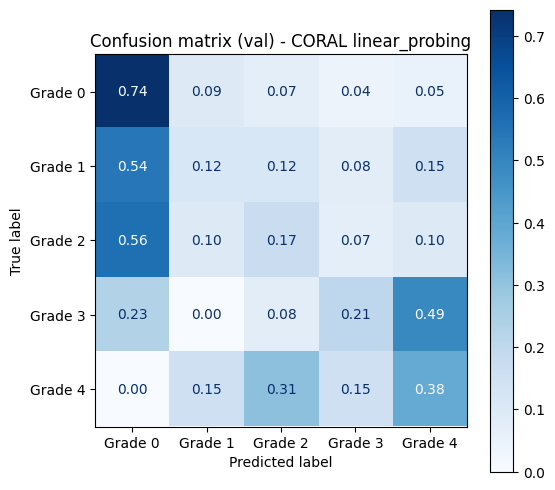


Fold 4/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 3.00e-04 | Train loss: 2.4874 | Val loss: 2.2483 | Acc: 0.1620 | QWK: 0.1051 | AUC: 0.5278
	Epoch  5/50 | LR: 2.93e-04 | Train loss: 1.8923 | Val loss: 1.9115 | Acc: 0.4583 | QWK: 0.2880 | AUC: 0.6078
	Epoch 10/50 | LR: 2.71e-04 | Train loss: 1.7718 | Val loss: 1.8001 | Acc: 0.4630 | QWK: 0.3464 | AUC: 0.6401
	Epoch 15/50 | LR: 2.38e-04 | Train loss: 1.6811 | Val loss: 1.7459 | Acc: 0.4583 | QWK: 0.3984 | AUC: 0.6590
	Epoch 20/50 | LR: 1.97e-04 | Train loss: 1.6639 | Val loss: 1.6998 | Acc: 0.4583 | QWK: 0.4519 | AUC: 0.6706
	Epoch 25/50 | LR: 1.50e-04 | Train loss: 1.6187 | Val loss: 1.6775 | Acc: 0.4676 | QWK: 0.4735 | AUC: 0.6764
	Epoch 30/50 | LR: 1.04e-04 | Train loss: 1.6280 | Val loss: 1.6750 | Acc: 0.4769 | QWK: 0.5106 | AUC: 0.6737
	Epoch 35/50 | LR: 6.26e-05 | Train loss: 1.5788 | Val loss: 1.6468 | Acc: 0.4722 | QWK: 0.4846 | AUC: 0.6808
	Epoch 40/50 | LR: 2.96e-05 | Train loss:

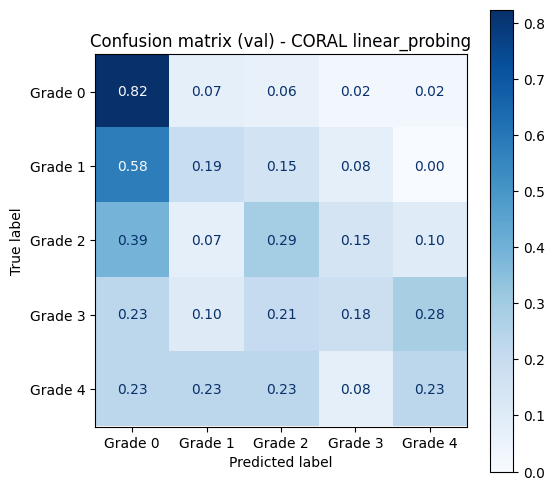


Fold 5/5
	CORAL importance weights: [0.76483685 0.77840304 0.8988224  1.        ]
	Epoch  1/50 | LR: 3.00e-04 | Train loss: 2.4092 | Val loss: 2.2750 | Acc: 0.1667 | QWK: 0.1299 | AUC: 0.5200
	Epoch  5/50 | LR: 2.93e-04 | Train loss: 1.8804 | Val loss: 1.9417 | Acc: 0.3796 | QWK: 0.2592 | AUC: 0.6122
	Epoch 10/50 | LR: 2.71e-04 | Train loss: 1.7442 | Val loss: 1.8536 | Acc: 0.4213 | QWK: 0.3539 | AUC: 0.6477
	Epoch 15/50 | LR: 2.38e-04 | Train loss: 1.6855 | Val loss: 1.8025 | Acc: 0.4306 | QWK: 0.4043 | AUC: 0.6608
	Epoch 20/50 | LR: 1.97e-04 | Train loss: 1.6336 | Val loss: 1.7682 | Acc: 0.4167 | QWK: 0.4244 | AUC: 0.6726
	Epoch 25/50 | LR: 1.50e-04 | Train loss: 1.5811 | Val loss: 1.7416 | Acc: 0.4352 | QWK: 0.4445 | AUC: 0.6768
	Epoch 30/50 | LR: 1.04e-04 | Train loss: 1.5821 | Val loss: 1.7354 | Acc: 0.4306 | QWK: 0.4579 | AUC: 0.6784
	Epoch 35/50 | LR: 6.26e-05 | Train loss: 1.5612 | Val loss: 1.7182 | Acc: 0.4352 | QWK: 0.4357 | AUC: 0.6806
	Epoch 40/50 | LR: 2.96e-05 | Train l

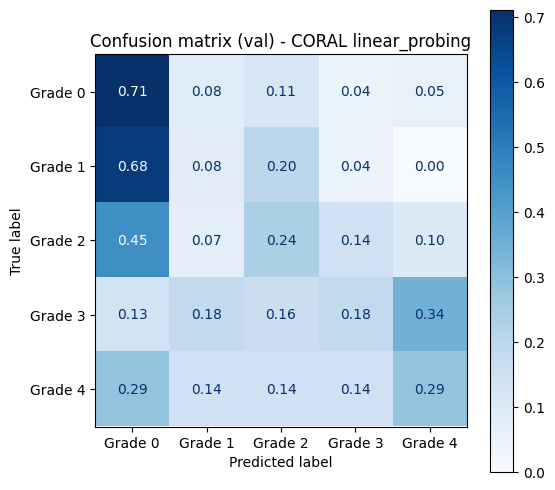


Results (Coral linear probing, 5-fold CV):
	Accuracy: 0.4491 +/- 0.0325
	QWK: 0.4870 +/- 0.0294
	AUC: 0.6826 +/- 0.0206


In [21]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'linear_probing' 
use_coral = True            

N_FOLDS, EPOCHS, BATCH_SIZE = 5, 50, 32
NUM_CLASSES=5

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
fold_results_coral = []


for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(all_targets)), all_targets), 1):
    print(f"\nFold {fold}/{N_FOLDS}")
    
    coral_importance = compute_coral_importance(all_targets[train_idx])
    print(f"\tCORAL importance weights: {coral_importance.cpu().numpy()}")
    
    fold_pixels = train_proc_imgs[train_idx].reshape(-1, 3).astype(np.float32)
    fold_mean = torch.tensor(fold_pixels.mean(axis=0) / 255.0)
    fold_std = torch.tensor(fold_pixels.std(axis=0) / 255.0)
    fold_train_transforms = make_train_transforms(fold_mean, fold_std)
    fold_eval_transforms = make_eval_transforms(fold_mean, fold_std)

    train_fold = FolderDataset([all_paths[i] for i in train_idx], all_targets[train_idx], fold_train_transforms)
    train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    val_fold   = FolderDataset([all_paths[i] for i in val_idx],   all_targets[val_idx],   fold_eval_transforms)
    val_loader   = DataLoader(val_fold,   BATCH_SIZE, shuffle=False,
                              worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    model = get_model(num_classes=NUM_CLASSES, strategy=strategy, use_coral=use_coral)
    set_trainable_layers(model, strategy)
    fold_model, fold_metrics, _ = train_coral(model, train_loader, val_loader,
            epochs=EPOCHS, importance_weights=coral_importance)
    acc = accuracy_score(fold_metrics['val_labels'], fold_metrics['val_preds'])
    qwk = cohen_kappa_score(fold_metrics['val_labels'], fold_metrics['val_preds'], weights='quadratic')
    auc = roc_auc_score(fold_metrics['val_labels'], fold_metrics['val_probs'], multi_class='ovr', average='macro')
    fold_results_coral.append({'acc': acc, 'qwk': qwk, 'auc': auc})

accs_coral = [r['acc'] for r in fold_results_coral]
qwks_coral = [r['qwk'] for r in fold_results_coral]
aucs_coral = [r['auc'] for r in fold_results_coral]

print(f"\nResults (Coral linear probing, {N_FOLDS}-fold CV):")
print(f"\tAccuracy: {np.mean(accs_coral):.4f} +/- {np.std(accs_coral):.4f}")
print(f"\tQWK: {np.mean(qwks_coral):.4f} +/- {np.std(qwks_coral):.4f}")
print(f"\tAUC: {np.mean(aucs_coral):.4f} +/- {np.std(aucs_coral):.4f}")

### Training on the full training set

	Epoch  1/50 | LR: 3.00e-04 | Train loss: 2.3701 | Val loss: 2.1630 | Acc: 0.2583 | QWK: 0.2387 | AUC: 0.5600
	Epoch  5/50 | LR: 2.93e-04 | Train loss: 1.8396 | Val loss: 1.8324 | Acc: 0.4500 | QWK: 0.4452 | AUC: 0.6259
	Epoch 10/50 | LR: 2.71e-04 | Train loss: 1.6931 | Val loss: 1.7415 | Acc: 0.4417 | QWK: 0.5171 | AUC: 0.6648
	Epoch 15/50 | LR: 2.38e-04 | Train loss: 1.6449 | Val loss: 1.6935 | Acc: 0.4917 | QWK: 0.5528 | AUC: 0.6828
	Epoch 20/50 | LR: 1.97e-04 | Train loss: 1.6076 | Val loss: 1.6349 | Acc: 0.5167 | QWK: 0.5674 | AUC: 0.6957
	Epoch 25/50 | LR: 1.50e-04 | Train loss: 1.5785 | Val loss: 1.6254 | Acc: 0.5083 | QWK: 0.5852 | AUC: 0.7080
	Epoch 30/50 | LR: 1.04e-04 | Train loss: 1.5435 | Val loss: 1.6053 | Acc: 0.4917 | QWK: 0.5958 | AUC: 0.7105
	Epoch 35/50 | LR: 6.26e-05 | Train loss: 1.5325 | Val loss: 1.5922 | Acc: 0.5000 | QWK: 0.6000 | AUC: 0.7121
	Epoch 40/50 | LR: 2.96e-05 | Train loss: 1.5391 | Val loss: 1.5882 | Acc: 0.4917 | QWK: 0.6035 | AUC: 0.7210
	Epoch 45/

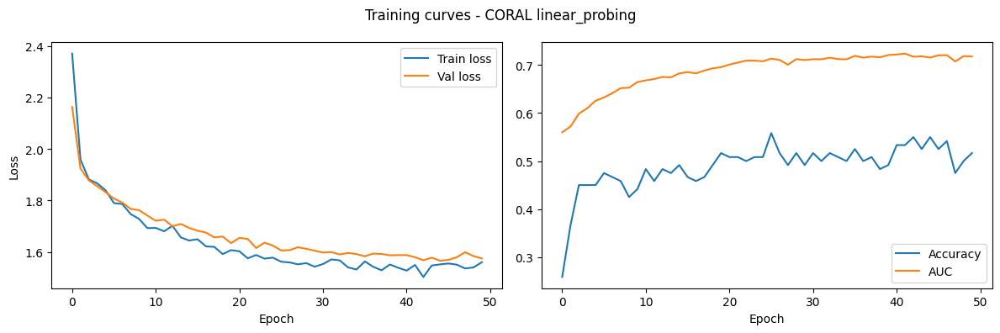


val set results:
	Macro F1: 0.3750
	QWK: 0.6117
	Accuracy: 0.5333
	AUC: 0.7241

Per-class metrics:
	Grade 0: precision=0.714	recall=0.833	F1=0.769
	Grade 1: precision=0.167	recall=0.167	F1=0.167
	Grade 2: precision=0.526	recall=0.357	F1=0.426
	Grade 3: precision=0.385	recall=0.250	F1=0.303
	Grade 4: precision=0.154	recall=0.333	F1=0.211


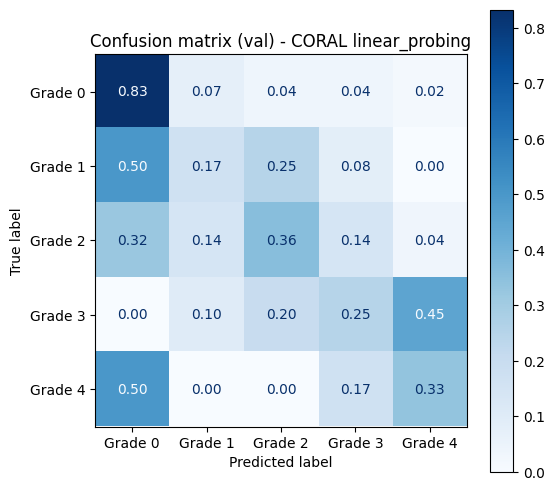

In [22]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'linear_probing' 
use_coral = True         

imp = compute_coral_importance(all_targets)

train_fold = FolderDataset(all_paths, all_targets, train_transforms)
train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

val_loader   = DataLoader(val_data,   BATCH_SIZE, shuffle=False,
                            worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

model_coral_LP = get_model(num_classes=NUM_CLASSES, strategy=strategy, use_coral=use_coral)
set_trainable_layers(model_coral_LP, strategy)

model_coral_LP, metrics_coral_LP, history_coral_LP = train_coral(model_coral_LP, train_loader, val_loader,
        epochs=EPOCHS, importance_weights=imp, plot=True)

## 9. Partial fine-tuning: cross-entropy model CV and final training


Fold 1/5
	Class weights:	 {0: np.float32(0.445), 1: np.float32(1.678), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 1.6117 | Val loss: 1.5877 | Acc: 0.2639 | QWK: 0.0459 | AUC: 0.5761
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.5176 | Val loss: 1.4879 | Acc: 0.4306 | QWK: 0.4953 | AUC: 0.7009
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.3833 | Val loss: 1.3470 | Acc: 0.5093 | QWK: 0.6214 | AUC: 0.7615
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.2431 | Val loss: 1.2478 | Acc: 0.4907 | QWK: 0.6594 | AUC: 0.7954
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.1243 | Val loss: 1.1541 | Acc: 0.4769 | QWK: 0.6945 | AUC: 0.8156
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.0556 | Val loss: 1.1329 | Acc: 0.4907 | QWK: 0.6911 | AUC: 0.8217
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 0.9718 | Val loss: 1.1217 | Acc: 0.5000 | QWK: 0.6922 | AUC: 0.8257
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 0.9690 | Val loss: 1.1250 | Acc: 0.5093 | QWK: 0.70

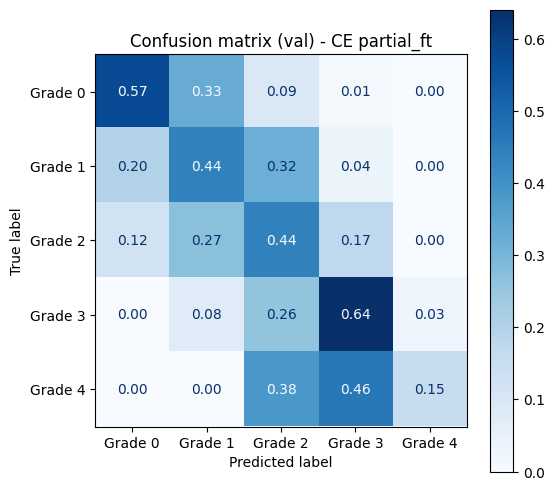


Fold 2/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 1.6103 | Val loss: 1.6025 | Acc: 0.2269 | QWK: 0.0717 | AUC: 0.5537
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.5051 | Val loss: 1.4989 | Acc: 0.4537 | QWK: 0.4128 | AUC: 0.6979
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.3608 | Val loss: 1.3618 | Acc: 0.5324 | QWK: 0.5888 | AUC: 0.7759
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.1973 | Val loss: 1.1959 | Acc: 0.5556 | QWK: 0.6123 | AUC: 0.8194
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.0831 | Val loss: 1.1239 | Acc: 0.5463 | QWK: 0.6265 | AUC: 0.8338
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.0238 | Val loss: 1.1002 | Acc: 0.5324 | QWK: 0.6678 | AUC: 0.8416
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 0.9337 | Val loss: 1.0755 | Acc: 0.5231 | QWK: 0.6832 | AUC: 0.8457
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 0.9184 | Val loss: 1.0707 | Acc: 0.5370 | QWK: 0.68

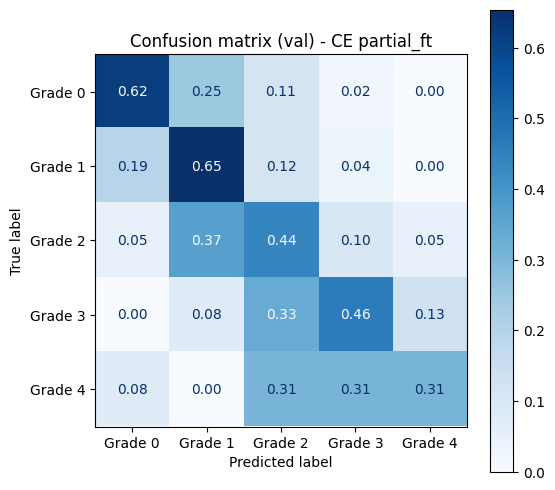


Fold 3/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 1.6193 | Val loss: 1.6314 | Acc: 0.1713 | QWK: 0.0763 | AUC: 0.5692
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.5300 | Val loss: 1.5472 | Acc: 0.3241 | QWK: 0.3610 | AUC: 0.7076
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.3898 | Val loss: 1.4271 | Acc: 0.4537 | QWK: 0.5336 | AUC: 0.7674
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.2352 | Val loss: 1.2911 | Acc: 0.5185 | QWK: 0.6391 | AUC: 0.8072
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.1189 | Val loss: 1.1785 | Acc: 0.5509 | QWK: 0.6938 | AUC: 0.8370
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.0412 | Val loss: 1.1025 | Acc: 0.5648 | QWK: 0.7277 | AUC: 0.8511
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 0.9827 | Val loss: 1.0929 | Acc: 0.5694 | QWK: 0.7288 | AUC: 0.8583
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 0.9635 | Val loss: 1.0769 | Acc: 0.5509 | QWK: 0.72

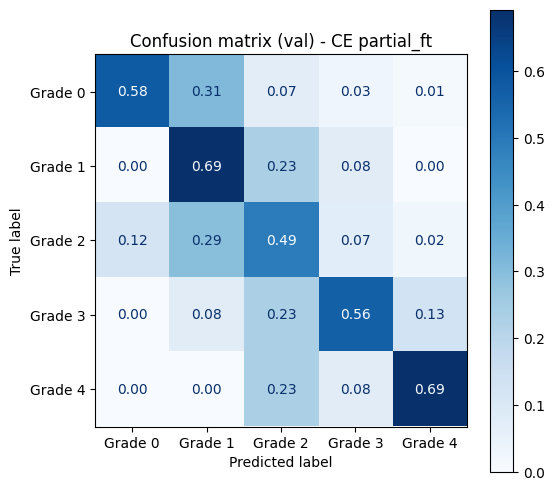


Fold 4/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.694), 2: np.float32(1.047), 3: np.float32(1.115), 4: np.float32(3.26)}
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 1.6178 | Val loss: 1.6172 | Acc: 0.1806 | QWK: 0.0393 | AUC: 0.4842
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.5225 | Val loss: 1.5042 | Acc: 0.3889 | QWK: 0.4509 | AUC: 0.6759
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.3921 | Val loss: 1.3771 | Acc: 0.4861 | QWK: 0.5777 | AUC: 0.7413
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.2375 | Val loss: 1.2299 | Acc: 0.5324 | QWK: 0.6803 | AUC: 0.7961
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.1395 | Val loss: 1.1448 | Acc: 0.5370 | QWK: 0.6786 | AUC: 0.8292
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.0607 | Val loss: 1.0740 | Acc: 0.5787 | QWK: 0.7166 | AUC: 0.8500
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 1.0081 | Val loss: 1.0555 | Acc: 0.5694 | QWK: 0.7104 | AUC: 0.8562
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 0.9674 | Val loss: 1.0454 | Acc: 0.5694 | QWK: 0.72

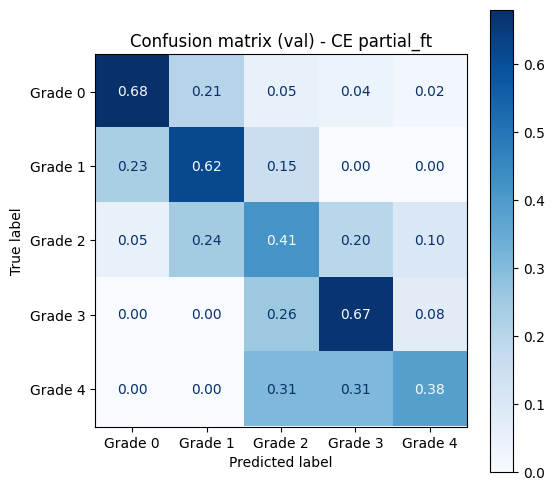


Fold 5/5
	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.678), 2: np.float32(1.054), 3: np.float32(1.108), 4: np.float32(3.323)}
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 1.6257 | Val loss: 1.5894 | Acc: 0.2685 | QWK: 0.0236 | AUC: 0.5487
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.5374 | Val loss: 1.5184 | Acc: 0.4028 | QWK: 0.3345 | AUC: 0.6808
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.3991 | Val loss: 1.3989 | Acc: 0.4907 | QWK: 0.4958 | AUC: 0.7605
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.2417 | Val loss: 1.2906 | Acc: 0.5093 | QWK: 0.5926 | AUC: 0.7993
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.1210 | Val loss: 1.2225 | Acc: 0.5648 | QWK: 0.6598 | AUC: 0.8257
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.0300 | Val loss: 1.1653 | Acc: 0.5602 | QWK: 0.6644 | AUC: 0.8419
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 0.9596 | Val loss: 1.1464 | Acc: 0.5741 | QWK: 0.6638 | AUC: 0.8484
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 0.8992 | Val loss: 1.1331 | Acc: 0.5787 | QWK: 0.6

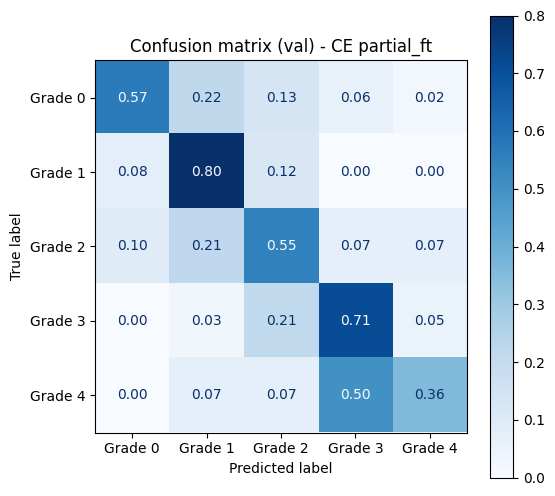


Results (CE partial fine-tuning, 5-fold CV):
	Accuracy: 0.5685 +/- 0.0333
	QWK: 0.7225 +/- 0.0238
	AUC: 0.8550 +/- 0.0122


In [23]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'partial_ft' 
use_coral = False         

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
fold_results_ce = []


for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(all_targets)), all_targets), 1):
    print(f"\nFold {fold}/{N_FOLDS}")
    
    classes = np.unique(all_targets[train_idx])
    class_weights = compute_class_weight('balanced', classes=classes, y=all_targets[train_idx])
    w = torch.tensor(class_weights, dtype=torch.float32, device=DEVICE)
    print(f"\tClass weights:\t", dict(zip(classes.tolist(), np.round(w.cpu().numpy(), 3))))

    train_fold = FolderDataset([all_paths[i] for i in train_idx], all_targets[train_idx], train_transforms)
    train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    val_fold   = FolderDataset([all_paths[i] for i in val_idx],   all_targets[val_idx],   eval_transforms)
    val_loader   = DataLoader(val_fold,   BATCH_SIZE, shuffle=False,
                              worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    model = get_model(num_classes=NUM_CLASSES, strategy=strategy, use_coral=use_coral)
    set_trainable_layers(model, strategy)
    fold_model, fold_metrics, _ = train_ce(model, train_loader, val_loader,
            epochs=EPOCHS, class_weights_data=w, strategy=strategy)
    acc = accuracy_score(fold_metrics['val_labels'], fold_metrics['val_preds'])
    qwk = cohen_kappa_score(fold_metrics['val_labels'], fold_metrics['val_preds'], weights='quadratic')
    auc = roc_auc_score(fold_metrics['val_labels'], fold_metrics['val_probs'], multi_class='ovr', average='macro')
    fold_results_ce.append({'acc': acc, 'qwk': qwk, 'auc': auc})

accs_ce = [r['acc'] for r in fold_results_ce]
qwks_ce = [r['qwk'] for r in fold_results_ce]
aucs_ce = [r['auc'] for r in fold_results_ce]

print(f"\nResults (CE partial fine-tuning, {N_FOLDS}-fold CV):")
print(f"\tAccuracy: {np.mean(accs_ce):.4f} +/- {np.std(accs_ce):.4f}")
print(f"\tQWK: {np.mean(qwks_ce):.4f} +/- {np.std(qwks_ce):.4f}")
print(f"\tAUC: {np.mean(aucs_ce):.4f} +/- {np.std(aucs_ce):.4f}")

### Training on the full training set

	Class weights:	 {0: np.float32(0.444), 1: np.float32(1.688), 2: np.float32(1.049), 3: np.float32(1.113), 4: np.float32(3.273)}
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 1.6150 | Val loss: 1.5902 | Acc: 0.2583 | QWK: -0.0646 | AUC: 0.5170
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.4971 | Val loss: 1.4553 | Acc: 0.4917 | QWK: 0.5054 | AUC: 0.6928
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.3119 | Val loss: 1.2870 | Acc: 0.5667 | QWK: 0.6863 | AUC: 0.7796
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.1535 | Val loss: 1.1751 | Acc: 0.5833 | QWK: 0.7166 | AUC: 0.8123
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.0096 | Val loss: 1.1193 | Acc: 0.5333 | QWK: 0.7023 | AUC: 0.8202
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 0.9554 | Val loss: 1.1319 | Acc: 0.5500 | QWK: 0.7033 | AUC: 0.8167
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 0.9100 | Val loss: 1.1222 | Acc: 0.5750 | QWK: 0.7388 | AUC: 0.8149
	Early stopping at epoch 33


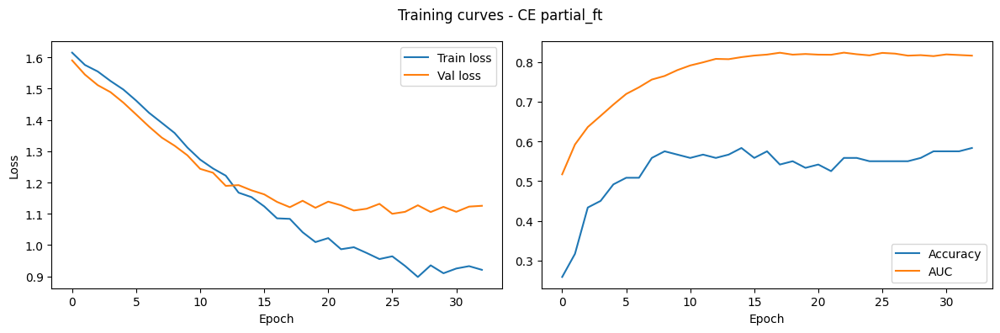


val set results:
	Macro F1: 0.4541
	QWK: 0.7298
	Accuracy: 0.5583
	AUC: 0.8236

Per-class metrics:
	Grade 0: precision=0.973	recall=0.667	F1=0.791
	Grade 1: precision=0.235	recall=0.667	F1=0.348
	Grade 2: precision=0.571	recall=0.429	F1=0.490
	Grade 3: precision=0.476	recall=0.500	F1=0.488
	Grade 4: precision=0.143	recall=0.167	F1=0.154


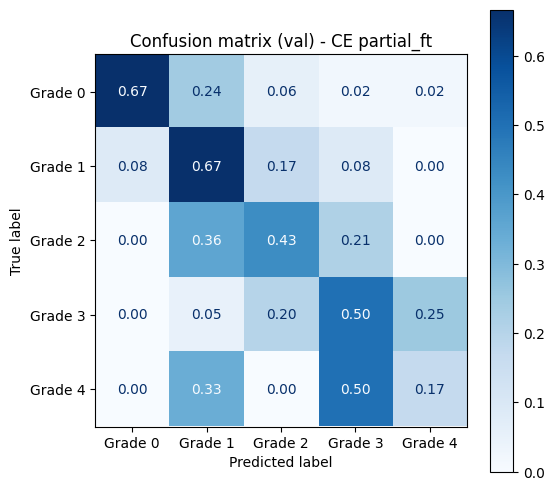

In [24]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'partial_ft' 
use_coral = False         

    
classes = np.unique(all_targets)
class_weights = compute_class_weight('balanced', classes=classes, y=all_targets)
w = torch.tensor(class_weights, dtype=torch.float32, device=DEVICE)
print(f"\tClass weights:\t", dict(zip(classes.tolist(), np.round(w.cpu().numpy(), 3))))

train_fold = FolderDataset(all_paths, all_targets, train_transforms)
train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

val_loader   = DataLoader(val_data,   BATCH_SIZE, shuffle=False,
                            worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

model_ce_PFT = get_model(num_classes=NUM_CLASSES, strategy=strategy, use_coral=use_coral)
set_trainable_layers(model_ce_PFT, strategy)

model_ce_PFT, metrics_ce_PFT, history_ce_PFT = train_ce(model_ce_PFT, train_loader, val_loader,
        epochs=EPOCHS, class_weights_data=w, plot=True, strategy=strategy)

## 10. Partial fine-tuning: CORAL model CV and final training


Fold 1/5
	CORAL importance weights: [0.7661134 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 2.6654 | Val loss: 2.6532 | Acc: 0.0833 | QWK: 0.0319 | AUC: 0.5447
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.7381 | Val loss: 1.7580 | Acc: 0.4213 | QWK: 0.5197 | AUC: 0.6987
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.4552 | Val loss: 1.4593 | Acc: 0.5046 | QWK: 0.6051 | AUC: 0.7621
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.3902 | Val loss: 1.4047 | Acc: 0.4907 | QWK: 0.6540 | AUC: 0.7707
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.3395 | Val loss: 1.3907 | Acc: 0.5139 | QWK: 0.6391 | AUC: 0.7728
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.3180 | Val loss: 1.3834 | Acc: 0.5093 | QWK: 0.6651 | AUC: 0.7715
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 1.2901 | Val loss: 1.3807 | Acc: 0.4954 | QWK: 0.6528 | AUC: 0.7742
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 1.2954 | Val loss: 1.3767 | Acc: 0.5093 | QWK: 0.6575 | AUC: 0.7782
	Epoch 40/50 | LR: 2.81e-06 | Train loss:

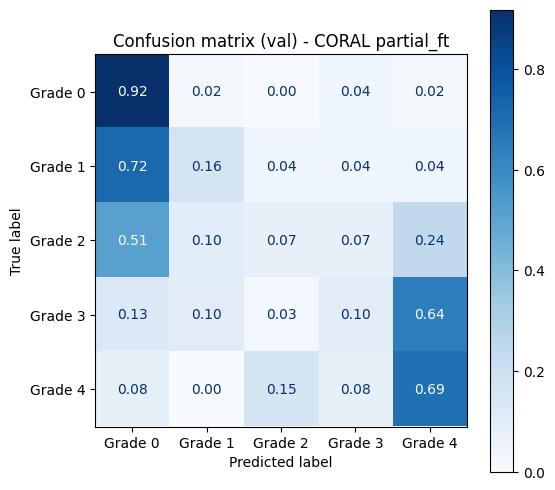


Fold 2/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 2.5198 | Val loss: 2.4708 | Acc: 0.1111 | QWK: 0.0707 | AUC: 0.5668
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.6967 | Val loss: 1.7926 | Acc: 0.4028 | QWK: 0.3890 | AUC: 0.6478
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.4069 | Val loss: 1.5477 | Acc: 0.4537 | QWK: 0.5380 | AUC: 0.7081
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.3587 | Val loss: 1.4949 | Acc: 0.4722 | QWK: 0.5722 | AUC: 0.7222
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.3271 | Val loss: 1.4721 | Acc: 0.4861 | QWK: 0.5914 | AUC: 0.7318
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.2993 | Val loss: 1.4489 | Acc: 0.5000 | QWK: 0.6200 | AUC: 0.7368
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 1.2643 | Val loss: 1.4345 | Acc: 0.5046 | QWK: 0.6073 | AUC: 0.7414
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 1.2437 | Val loss: 1.4337 | Acc: 0.5139 | QWK: 0.6129 | AUC: 0.7418
	Epoch 40/50 | LR: 2.81e-06 | Train loss:

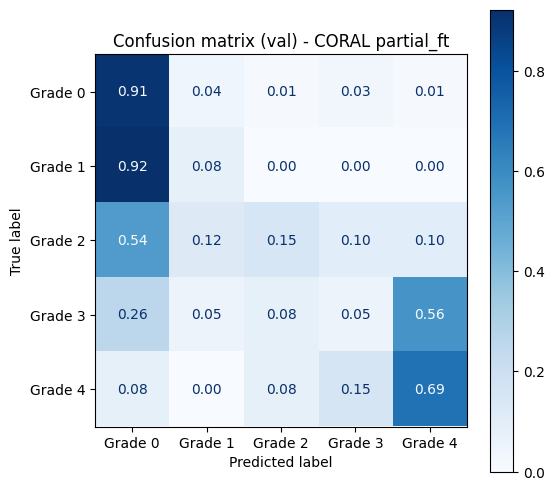


Fold 3/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 2.7860 | Val loss: 2.8055 | Acc: 0.0648 | QWK: 0.0035 | AUC: 0.5149
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.7911 | Val loss: 1.9723 | Acc: 0.3194 | QWK: 0.4059 | AUC: 0.6267
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.4327 | Val loss: 1.5393 | Acc: 0.4537 | QWK: 0.5938 | AUC: 0.7208
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.3697 | Val loss: 1.4666 | Acc: 0.4676 | QWK: 0.6161 | AUC: 0.7388
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.3134 | Val loss: 1.4347 | Acc: 0.4676 | QWK: 0.6501 | AUC: 0.7489
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.3050 | Val loss: 1.4111 | Acc: 0.4954 | QWK: 0.6544 | AUC: 0.7595
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 1.2762 | Val loss: 1.3995 | Acc: 0.5000 | QWK: 0.6550 | AUC: 0.7643
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 1.2662 | Val loss: 1.4025 | Acc: 0.4907 | QWK: 0.6678 | AUC: 0.7599
	Epoch 40/50 | LR: 2.81e-06 | Train loss:

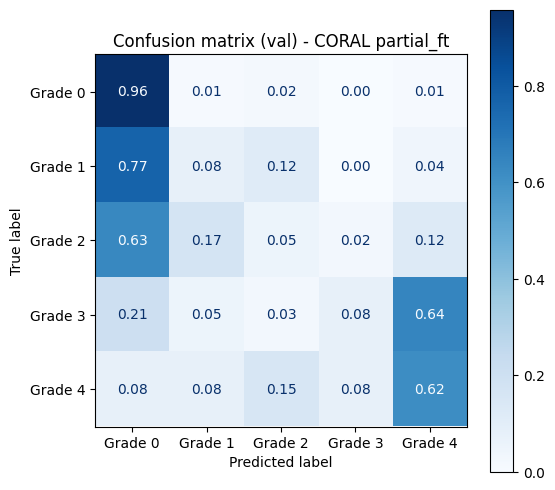


Fold 4/5
	CORAL importance weights: [0.7653082 0.7780909 0.8993764 1.       ]
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 2.7018 | Val loss: 2.5164 | Acc: 0.0880 | QWK: 0.0377 | AUC: 0.5187
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.7540 | Val loss: 1.7398 | Acc: 0.4491 | QWK: 0.4725 | AUC: 0.6863
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.5047 | Val loss: 1.4628 | Acc: 0.5000 | QWK: 0.5454 | AUC: 0.7453
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.4151 | Val loss: 1.3688 | Acc: 0.5231 | QWK: 0.6603 | AUC: 0.7667
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.3797 | Val loss: 1.3418 | Acc: 0.4954 | QWK: 0.6585 | AUC: 0.7671
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.3372 | Val loss: 1.3296 | Acc: 0.4907 | QWK: 0.6711 | AUC: 0.7675
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 1.3171 | Val loss: 1.3189 | Acc: 0.5046 | QWK: 0.6653 | AUC: 0.7711
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 1.3317 | Val loss: 1.3104 | Acc: 0.4954 | QWK: 0.6972 | AUC: 0.7742
	Epoch 40/50 | LR: 2.81e-06 | Train loss:

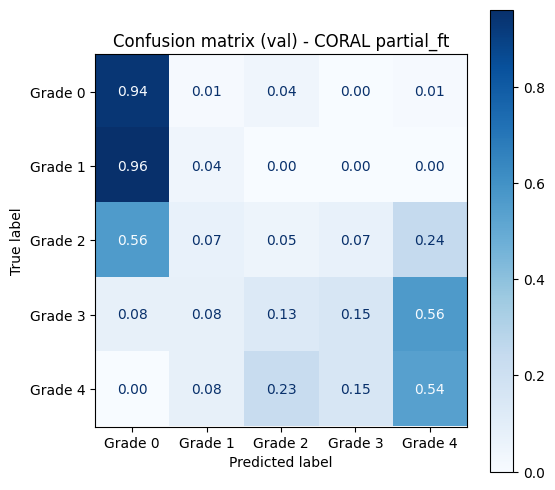


Fold 5/5
	CORAL importance weights: [0.76483685 0.77840304 0.8988224  1.        ]
	Epoch  1/50 | LR: 2.00e-05 | Train loss: 2.5813 | Val loss: 2.4776 | Acc: 0.0648 | QWK: 0.0664 | AUC: 0.4913
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.7093 | Val loss: 1.7906 | Acc: 0.3796 | QWK: 0.4208 | AUC: 0.6628
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.4313 | Val loss: 1.5530 | Acc: 0.4676 | QWK: 0.5612 | AUC: 0.7136
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.3508 | Val loss: 1.4900 | Acc: 0.4722 | QWK: 0.6129 | AUC: 0.7258
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.3057 | Val loss: 1.4680 | Acc: 0.5046 | QWK: 0.6300 | AUC: 0.7332
	Epoch 25/50 | LR: 1.05e-05 | Train loss: 1.2869 | Val loss: 1.4518 | Acc: 0.5000 | QWK: 0.6539 | AUC: 0.7428
	Epoch 30/50 | LR: 7.56e-06 | Train loss: 1.2603 | Val loss: 1.4529 | Acc: 0.5185 | QWK: 0.6473 | AUC: 0.7380
	Epoch 35/50 | LR: 4.92e-06 | Train loss: 1.2461 | Val loss: 1.4417 | Acc: 0.5093 | QWK: 0.6527 | AUC: 0.7418
	Epoch 40/50 | LR: 2.81e-06 | Train l

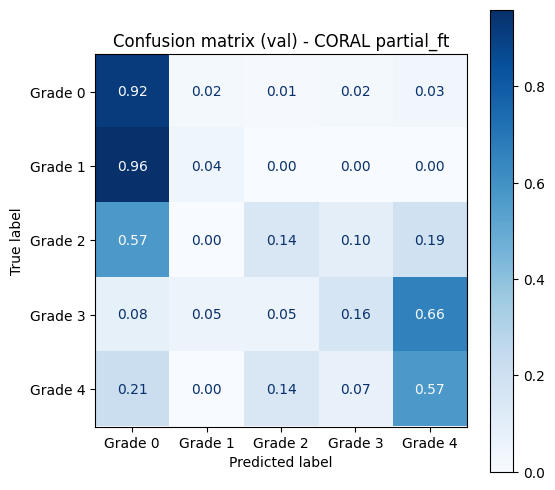


Results (Coral partial fine-tuning, 5-fold CV):
	Accuracy: 0.5019 +/- 0.0063
	QWK: 0.6631 +/- 0.0209
	AUC: 0.7623 +/- 0.0136


In [25]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'partial_ft' 
use_coral = True        

N_FOLDS, EPOCHS, BATCH_SIZE = 5, 50, 32
NUM_CLASSES=5

skf = StratifiedKFold(n_splits=N_FOLDS, shuffle=True, random_state=SEED)
fold_results_coral = []


for fold, (train_idx, val_idx) in enumerate(skf.split(np.zeros(len(all_targets)), all_targets), 1):
    print(f"\nFold {fold}/{N_FOLDS}")
    
    coral_importance = compute_coral_importance(all_targets[train_idx])
    print(f"\tCORAL importance weights: {coral_importance.cpu().numpy()}")
    
    fold_pixels = train_proc_imgs[train_idx].reshape(-1, 3).astype(np.float32)
    fold_mean = torch.tensor(fold_pixels.mean(axis=0) / 255.0)
    fold_std = torch.tensor(fold_pixels.std(axis=0) / 255.0)
    fold_train_transforms = make_train_transforms(fold_mean, fold_std)
    fold_eval_transforms = make_eval_transforms(fold_mean, fold_std)

    train_fold = FolderDataset([all_paths[i] for i in train_idx], all_targets[train_idx], fold_train_transforms)
    train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    val_fold   = FolderDataset([all_paths[i] for i in val_idx],   all_targets[val_idx],   fold_eval_transforms)
    val_loader   = DataLoader(val_fold,   BATCH_SIZE, shuffle=False,
                              worker_init_fn=worker_init_fn, num_workers=2, generator=gen)
    
    model = get_model(num_classes=NUM_CLASSES, strategy=strategy, use_coral=use_coral)
    set_trainable_layers(model, strategy)
    fold_model, fold_metrics, _ = train_coral(model, train_loader, val_loader,
            epochs=EPOCHS, importance_weights=coral_importance, strategy=strategy)
    acc = accuracy_score(fold_metrics['val_labels'], fold_metrics['val_preds'])
    qwk = cohen_kappa_score(fold_metrics['val_labels'], fold_metrics['val_preds'], weights='quadratic')
    auc = roc_auc_score(fold_metrics['val_labels'], fold_metrics['val_probs'], multi_class='ovr', average='macro')
    fold_results_coral.append({'acc': acc, 'qwk': qwk, 'auc': auc})

accs_coral = [r['acc'] for r in fold_results_coral]
qwks_coral = [r['qwk'] for r in fold_results_coral]
aucs_coral = [r['auc'] for r in fold_results_coral]

print(f"\nResults (Coral partial fine-tuning, {N_FOLDS}-fold CV):")
print(f"\tAccuracy: {np.mean(accs_coral):.4f} +/- {np.std(accs_coral):.4f}")
print(f"\tQWK: {np.mean(qwks_coral):.4f} +/- {np.std(qwks_coral):.4f}")
print(f"\tAUC: {np.mean(aucs_coral):.4f} +/- {np.std(aucs_coral):.4f}")

### Training on the full training set

	Epoch  1/50 | LR: 2.00e-05 | Train loss: 2.6232 | Val loss: 2.4823 | Acc: 0.0583 | QWK: 0.0905 | AUC: 0.4986
	Epoch  5/50 | LR: 1.95e-05 | Train loss: 1.6433 | Val loss: 1.6481 | Acc: 0.5000 | QWK: 0.5724 | AUC: 0.7217
	Epoch 10/50 | LR: 1.82e-05 | Train loss: 1.3899 | Val loss: 1.4369 | Acc: 0.5417 | QWK: 0.6346 | AUC: 0.7967
	Epoch 15/50 | LR: 1.61e-05 | Train loss: 1.3493 | Val loss: 1.3901 | Acc: 0.4750 | QWK: 0.6533 | AUC: 0.7951
	Epoch 20/50 | LR: 1.34e-05 | Train loss: 1.3115 | Val loss: 1.3660 | Acc: 0.5083 | QWK: 0.6345 | AUC: 0.7906
	Early stopping at epoch 21


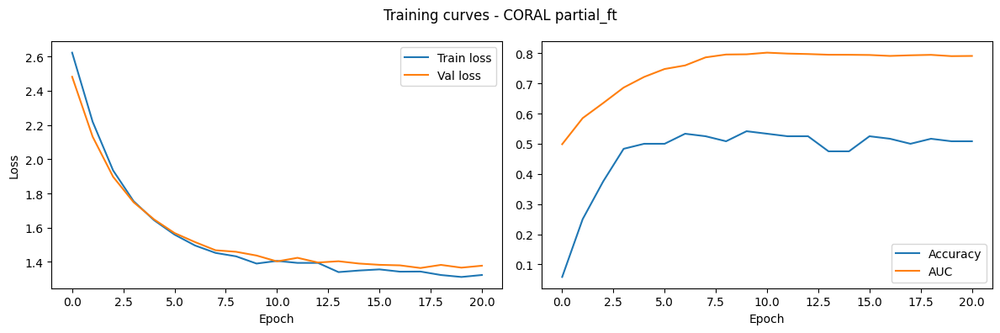


val set results:
	Macro F1: 0.3619
	QWK: 0.6454
	Accuracy: 0.5333
	AUC: 0.8022

Per-class metrics:
	Grade 0: precision=0.662	recall=0.907	F1=0.766
	Grade 1: precision=0.222	recall=0.167	F1=0.190
	Grade 2: precision=0.625	recall=0.179	F1=0.278
	Grade 3: precision=0.556	recall=0.250	F1=0.345
	Grade 4: precision=0.150	recall=0.500	F1=0.231


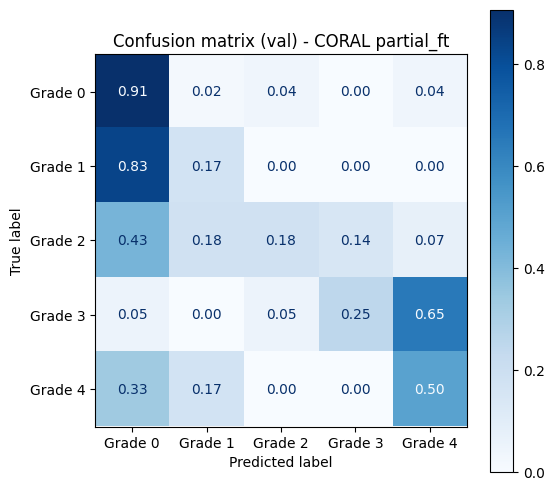

In [26]:
set_seed(SEED)
gen = torch.Generator()
gen.manual_seed(SEED)


strategy = 'partial_ft' 
use_coral = True         

imp = compute_coral_importance(all_targets)

train_fold = FolderDataset(all_paths, all_targets, train_transforms)
train_loader = DataLoader(train_fold, BATCH_SIZE, shuffle=True, worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

val_loader   = DataLoader(val_data,   BATCH_SIZE, shuffle=False,
                            worker_init_fn=worker_init_fn, num_workers=2, generator=gen)

model_coral_PFT = get_model(num_classes=NUM_CLASSES, strategy=strategy, use_coral=use_coral)
set_trainable_layers(model_coral_PFT, strategy)

model_coral_PFT, metrics_coral_PFT, history_coral_PFT = train_coral(model_coral_PFT, train_loader, val_loader,
        epochs=EPOCHS, importance_weights=imp, plot=True, strategy=strategy)

### Considerations

| Model head | Evaluation split | Accuracy | QWK | AUC |
| :--- | :--- | :--- | :--- | :--- |
| **CE linear probing** | 5-fold CV | 0.5093 $\pm$ 0.0209 | 0.5640 $\pm$ 0.0394 | 0.7887 $\pm$ 0.0120 |
| **CORAL linear probing** | 5-fold CV | 0.4491 $\pm$ 0.0325 | 0.4870 $\pm$ 0.0294 | 0.6826 $\pm$ 0.0206 |
| **CE partial fine-tuning** | 5-fold CV | 0.5685 $\pm$ 0.0333 | 0.7225 $\pm$ 0.0238 | 0.8550 $\pm$ 0.0122 |
| **CORAL fine-tuning** | 5-fold CV | 0.5019 $\pm$ 0.0063 | 0.6631 $\pm$ 0.0209 | 0.7623 $\pm$ 0.0136 |



Transitioning from linear probing to partial fine-tuning unlocks deeper feature adaptation, yielding a general upward shift in performance metrics across both architectures by allowing models to tailor higher-level representations to the target domain beyond pretrained baselines.

A comparative analysis of the evaluation results reveals that the standard Cross-Entropy model consistently outperforms the CORAL architecture across all configurations and training regimes. Under linear probing, the CE model achieves superior overall metrics, such as a QWK of 0.5640, and an AUC of 0.7887, compared to CORAL's lower performance across all categories.

This performance gap persists when moving to partial fine-tuning. Here, the CE model achieves robust improvements, reaching an accuracy of 0.5685, a high QWK of 0.7225, and an AUC of 0.8550. In contrast, while CORAL also benefits from partial fine-tuning, reaching a QWK of 0.6631, and an AUC of 0.7623, it consistently lags behind CE across every evaluated global metric.


**Given the overall superiority and enhanced representation capacity demonstrated by partial fine-tuning, all subsequent evaluations and test set experiments will be carried out exclusively using models trained under this regime.**

## 11. Operating point selection


### Evaluation on the test set


In [27]:
test_loader = DataLoader(test_data, batch_size=BATCH_SIZE, shuffle=False,
                         worker_init_fn=worker_init_fn, num_workers=2, generator=gen)


test set results:
	Macro F1: 0.4777
	QWK: 0.7076
	Accuracy: 0.5450
	AUC: 0.8551

Per-class metrics:
	Grade 0: precision=0.878	recall=0.580	F1=0.699
	Grade 1: precision=0.289	recall=0.717	F1=0.412
	Grade 2: precision=0.486	recall=0.391	F1=0.434
	Grade 3: precision=0.558	recall=0.632	F1=0.593
	Grade 4: precision=0.250	recall=0.250	F1=0.250


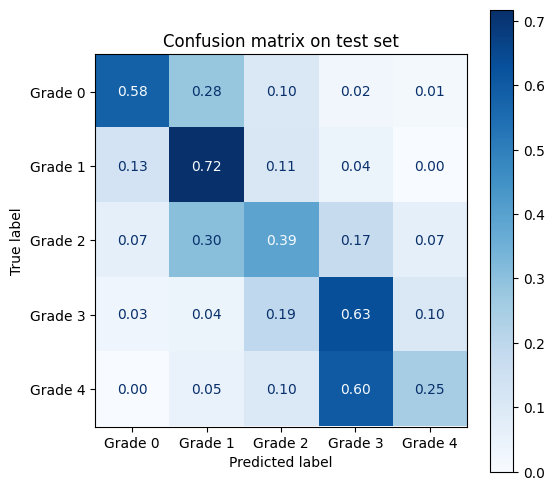

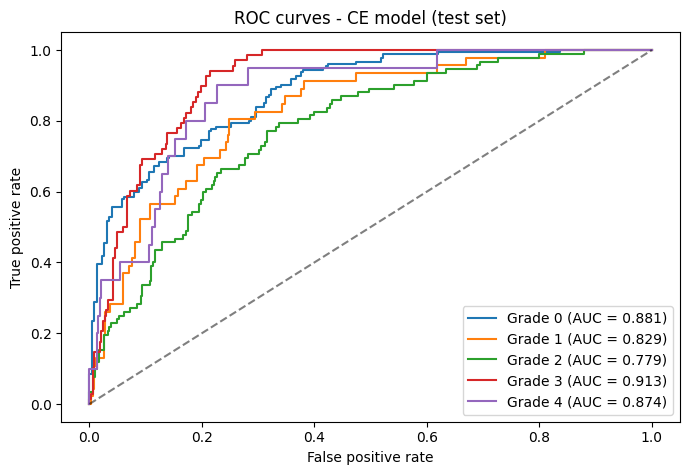

In [28]:
test_preds_ce_PFT, test_labels_ce_PFT, test_probs_ce_PFT, _ = validate_ce(model_ce_PFT, test_loader)
report_metrics(test_labels_ce_PFT, test_preds_ce_PFT, test_probs_ce_PFT, "test", "Confusion matrix on test set")
plot_roc(test_labels_ce_PFT, test_probs_ce_PFT, "ROC curves - CE model (test set)")


test set results:
	Macro F1: 0.2939
	QWK: 0.6452
	Accuracy: 0.4850
	AUC: 0.7503

Per-class metrics:
	Grade 0: precision=0.628	recall=0.914	F1=0.745
	Grade 1: precision=0.071	recall=0.043	F1=0.054
	Grade 2: precision=0.500	recall=0.098	F1=0.164
	Grade 3: precision=0.458	recall=0.162	F1=0.239
	Grade 4: precision=0.169	recall=0.650	F1=0.268


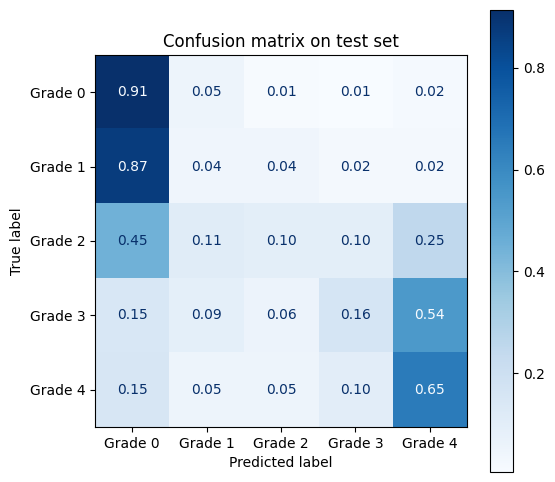

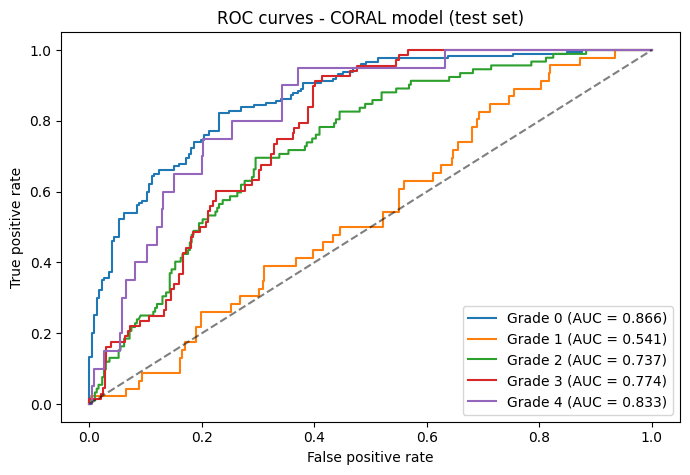

In [29]:
coral_importance = compute_coral_importance(all_targets)
test_preds_coral_PFT, test_labels_coral_PFT, test_probs_coral_PFT, _ = validate_coral(model_coral_PFT, test_loader, coral_importance)
report_metrics(test_labels_coral_PFT, test_preds_coral_PFT, test_probs_coral_PFT, "test", "Confusion matrix on test set")
plot_roc(test_labels_coral_PFT, test_probs_coral_PFT, "ROC curves - CORAL model (test set)")

| Model head | Accuracy | AUC | QWK | Macro F1 |
| -----------|----------|-----|-----|----------|
| **CE** | **0.5450** | **0.8551** | **0.7076**| **0.4777** |
| **CORAL** | 0.4850 | 0.7503 | 0.6452 | 0.2939 |


An evaluation of the partial fine-tuning test set results demonstrates that the CE framework outperforms the CORAL approach. While CORAL is explicitly designed to model ordinal relationships, empirical evidence demonstrates that the Cross-Entropy model achieves superior overall global metrics, including higher accuracy, area under the ROC curve, macro F1-score, and notably a stronger QWK.

Rather than suffering from severe per-class degradation, the Cross-Entropy model maintains a well-balanced error distribution across the entire multi-class spectrum. Its confusion matrix displays a stable, progressive diagonal concentration, successfully capturing intermediate feature representations without collapsing on minority or boundary classes. Every class ROC curve in the CE evaluation maintains a healthy and consistent separation above the random-guess diagonal baseline. However, despite this overall stability, the model still exhibits lower performance metrics for specific categories due to the inherent severe class imbalance of the dataset. For instance, while Grade 1 achieves a high recall (0.717), its precision remains constrained (0.289) because it tends to absorb neighboring cases. Similarly, Grade 2 exhibits constrained performance (precision of 0.486 and recall of 0.391), as its features frequently overlap with adjacent stages, resulting in notable dispersion towards both lower and higher grades in the confusion matrix. Conversely, Grade 4 suffers from low recall (0.250) and precision (0.250), with the confusion matrix clearly revealing that severe cases are frequently underestimated and pulled down toward Grade 3 (where 60% of true Grade 4 samples are erroneously predicted)
 
In contrast, the CORAL framework suffers from extreme predictive polarization under partial fine-tuning. It heavily biases predictions toward the healthy majority class (Grade 0, achieving a massive 0.914 recall) while severely compromising intermediate categories. At the same time, it maintains a high recall on the severe extreme (Grade 4, achieving 0.650 recall), though this is paired with a very low precision (0.169), indicating that many intermediate or adjacent cases, specifically grade 3, are incorrectly pulled into the most severe category. The trend on intermediate grades is clearly evidenced by its per-class breakdown, where Grade 1 collapses to a 0.043 recall and Grade 2 to 0.098, and by its ROC curves, where Grade 1 flattens out to hug the random classifier diagonal (AUC = 0.541) while intermediate grades show much weaker performance compared to the results of Grade 0 and Grade 4. Because CORAL fails to maintain stable per-class classification and suffers a heavy penalty in macro F1-score (F1-score = 0.2854 vs 0.4460 for CE) due to this structural collapse, standard Cross-Entropy proves to be much more reliable, balanced, and effective for clinical grading in this context.

From a clinical perspective, analyzing error distribution reveals critical safety profiles regarding false positives and false negatives. When the models misclassify, errors are fortunately and predominantly confined to adjacent severity grades or neighboring stages rather than erratic jumps across completely unrelated clinical conditions. For instance, errors in the CE model maintains a more balanced error profile across the entire spectrum: it remain safely bounded within adjacent stages, such as misclassifying an advanced Grade 3 case as Grade 4, ensuring patients still receive heightened clinical attention, while dangerous false negatives are virtually eliminated with zero true Grade 4 cases ever misclassified as healthy (Grade 0). Nevertheless, CORAL's structural failure leads to severe false negatives, particularly for early stages like Grade 1, which is so frequently misclassified and confused with Grade 0 that false negatives are almost equal to true negatives, posing a severe risk of delayed treatment and disease progression.


This pronounced performance on the test set aligns seamlessly with the outcomes observed during cross-validation, where standard Cross-Entropy already demonstrated clear overall superiority across all the metrics. CORAL's rigid cumulative probability decision thresholds made it highly susceptible to calibration drift when exposed to unseen test data. Consequently, standard Cross-Entropy consistently proves to be the more reliable, robust, and clinically balanced architecture throughout both validation and final test evaluations.

### Threshold selection

In [30]:
def pick_best_threshold(probs_val: np.ndarray, val_bin: np.ndarray) -> tuple[np.ndarray, dict[str, int], np.ndarray, np.ndarray]:
    """
    Tune threshold on validation set.

    Args:
        probs_val: predicted probabilities for the positive class (referable).
        val_bin: binary labels (0 for non-referable, 1 for referable).
    Returns:
        cand: array of candidate thresholds and their Se/Sp.
        pts: dict of selected threshold indices for Youden, default (0.5), Se >= 0.95, Sp >= 0.95.
        fpr: false positive rates for ROC curve.
        tpr: true positive rates for ROC curve.
    """
    fpr, tpr, _ = roc_curve(val_bin, probs_val)

    unique_thrs = np.unique(probs_val)
    cand = []
    for thr in unique_thrs:
        preds = (probs_val >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(val_bin, preds).ravel()
        se = tp / (tp + fn) if (tp + fn) > 0 else 0.0
        sp = tn / (tn + fp) if (tn + fp) > 0 else 0.0
        cand.append((thr, se, sp))
    cand = np.array(cand)

    tp = val_bin.sum()
    se = tp / len(val_bin) if len(val_bin) > 0 else 0.0
    sp = 1.0
    cand = np.vstack([cand, [0.0, se, sp]])

    if len(cand) == 0:
        return cand, {}, fpr, tpr

    youden_idx = np.argmax(cand[:, 1] + cand[:, 2] - 1)

    mask_se = cand[:, 1] >= 0.95
    screen_idx = np.where(mask_se)[0][np.argmax(cand[mask_se, 2])] if mask_se.any() else None

    mask_sp = cand[:, 2] >= 0.95
    diag_idx = np.where(mask_sp)[0][np.argmax(cand[mask_sp, 1])] if mask_sp.any() else None

    default_idx = np.argmin(np.abs(cand[:, 0] - 0.5))

    pts = {
        'Youden': youden_idx,
        'Default (0.5)': default_idx,
        'Se >= 0.95': screen_idx,
        'Sp >= 0.95': diag_idx,
    }
    return cand, pts, fpr, tpr


def report_roc_plot(model_name: str, cand: np.ndarray, pts: dict[str, int], fpr: np.ndarray, tpr: np.ndarray, auc_val: float):
    """
    Plot ROC curve with candidate thresholds.

    Args:
        model_name: string for plot title.
        cand: array of candidate thresholds and their Se/Sp.
        pts: dict of selected threshold indices for Youden, default (0.5), Se >= 0.95, Sp >= 0.95.
        fpr: false positive rates for ROC curve.
        tpr: true positive rates for ROC curve.
        auc_val: AUC value for the ROC curve.
    """
    plt.figure(figsize=(7, 5.5))
    plt.plot(fpr, tpr, 'b-', linewidth=2,
             label=f'ROC curve (AUC = {auc_val:.3f})')
    colors = {'Youden': 'green', 'Default (0.5)': 'red', 'Se >= 0.95': 'orange', 'Sp >= 0.95': 'purple'}
    markers = {'Youden': 'D', 'Default (0.5)': 'o', 'Se >= 0.95': 's', 'Sp >= 0.95': '^'}

    for name, idx in pts.items():
        if idx is None:
            continue
        thr, se, sp = cand[idx]
        plt.scatter(1 - sp, se, color=colors[name], marker=markers[name], s=80, zorder=5,
                    label=f"{name} (thr={thr:.3f}, Se={se:.3f}, Sp={sp:.3f})")
    plt.plot([0, 1], [0, 1], 'k--', alpha=0.4)
    plt.xlabel('1 - Specificity (FPR)')
    plt.ylabel('Sensitivity (TPR)')
    plt.title(f'ROC curve - {model_name} (validation, referable vs non-referable)')
    plt.legend(fontsize=8, loc='lower right')
    plt.tight_layout()
    plt.show()


def print_table(cand: np.ndarray, pts: dict[str, int], labels: np.ndarray, probs: np.ndarray, split_name: str):
    """
    Print Se, Sp, PPV, NPV table for the given split.

    Args:
        cand: array of candidate thresholds and their Se/Sp.
        pts: dict of selected threshold indices for Youden, default (0.5), Se >= 0.95, Sp >= 0.95.
        labels: true binary labels (0 or 1).
        probs: predicted probabilities for the positive class (referable).
        split_name: string label for the split (e.g., "Validation" or "Test").
    """
    print(f"\n{split_name} metrics - candidate thresholds")
    print(f"{'Point':<20s}  {'Thr':>5s}  {'Se':>5s}  {'Sp':>5s}  {'PPV':>5s}  {'NPV':>5s}")
    for name, idx in pts.items():
        if idx is None:
            print(f"{name:<20s}  {'-':>5s}  {'-':>5s}  {'-':>5s}  {'-':>5s}  {'-':>5s}")
            continue
        thr, se, sp = cand[idx]
        preds = (probs >= thr).astype(int)
        tn, fp, fn, tp = confusion_matrix(labels, preds).ravel()
        ppv = tp / (tp + fp) if (tp + fp) > 0 else 0.0
        npv = tn / (tn + fn) if (tn + fn) > 0 else 0.0
        print(f"{name:<20s}  {thr:.3f}  {se:.3f}  {sp:.3f}  {ppv:.3f}  {npv:.3f}")

### Clinical decision thresholds

In medical screening, relying on the default classification threshold (argmax for Cross-Entropy, or 0.5 for CORAL sigmoids) is often suboptimal. The choice of threshold should be guided by the clinical task, evaluating the cost of different types of errors.

### Task formulation

We reframe the 5-class ordinal grading task as a **binary screening decision**:

- **Non-referable** (grades 0-1): no immediate treatment needed.
- **Referable** (grades 2-4): requires specialist referral or treatment.

This mirrors real-world diabetic retinopathy screening workflows (e.g., NHS Diabetic Eye Screening Programme), where the goal is to **maximize sensitivity** (do not miss a diseased patient) while maintaining *acceptable specificity*.

#### Why considering Grade 1 (Mild NPDR) non-referable

There are no public documents about Italian healthcare, so we refer to the NHS Diabetic Eye Screening Programme and ICDR guidelines, which are widely accepted internationally.

[NHS Diabetic Eye Screening Programme](https://www.gov.uk/government/publications/diabetic-eye-screening-retinal-image-grading-criteria/nhs-diabetic-eye-screening-programme-grading-definitions-for-referable-disease-start-date-october-01)

[ICDR Guidelines](https://pmc.ncbi.nlm.nih.gov/articles/PMC10436766/)


Considering the standard diabetic retinopathy severity scale (ICDR):

| Grade | Description | Screening Decision |
|-------|-------------|-------------------|
| 0 | No DR | Annual/Bi-annual screening |
| 1 | Mild NPDR | Annual screening |
| 2 | Moderate NPDR | Screening interval shorter than one year |
| 3 | Severe NPDR | Specialist referral |
| 4 | Proliferative DR | Specialist referral and possible treatment |

Clinically, **Grade 1 (Mild NPDR)** is considered **non-referable** because it does not require treatment, but only annual monitoring, similar to Grade 0. The standard international referral threshold (NHS Diabetic Eye Screening Programme, ICDR guidelines) is **Grade 2+**.

If Grade 1 were included as referable:
- **Sensitivity would increase** (nearly all diseased patients would be caught).
- **Specificity would collapse**: many Mild NPDR patients would be referred unnecessarily.
- **PPV would drop significantly**, overwhelming the healthcare system with false positives.

Choosing Grade 2+ as the binarization threshold is therefore a **well-established clinical compromise**, balancing the need to detect disease against the cost of over-referral, overwhelming the healthcare system, and causing psychological stress to patients.

### Methodology

1. **Validation-based threshold tuning**  
   All candidate thresholds are evaluated exclusively on the validation set (120 samples), avoiding any data leakage and keeping the test set untouched for final evaluation. It is worth observing that 120 samples is relatively small for threshold calibration, so the selected thresholds may not generalize perfectly, but the final test evaluation provides an unbiased estimate of their true performance.

2. **Candidate operating points**  
   - **Youden Index** (Youden, 1950): maximizes $Se + Sp - 1$, corresponding to the point farthest from the diagonal on the ROC curve. Often used as a default when no clinical preference is specified.
   - **Screening threshold** ($Se \ge 0.95$): finds the threshold with the highest specificity while maintaining at least $95\%$ sensitivity. *Prioritizes patient safety* by minimizing false negatives.
   - **Diagnosis threshold** ($Sp \ge 0.95$): finds the threshold with the highest sensitivity while maintaining at least $95\%$ specificity. *Prioritizes resource efficiency* by minimizing unnecessary referrals.
   - **Default 0.5**: included as a reference baseline.

3. **ROC curve analysis**
   Thanks to the ROC curve, we can visualize the *trade-off between sensitivity and specificity* for different thresholds and select the most appropriate operating point based on clinical priorities.

4. **Performance metrics**  
   For each candidate threshold we report:
   - **Sensitivity (Se) (or Recall)**: true positive rate $\frac{TP}{(TP + FN)}$, it measures the ability to correctly identify the referable class (patients with the condition).
   - **Specificity (Sp)**: true negative rate $\frac{TN}{(TN + FP)}$, it measures the ability to correctly identify the non-referable class (healthy patients).
   - **Positive Predictive Value (PPV)**: precision for the referable class $\frac{TP}{(TP + FP)}$
   - **Negative Predictive Value (NPV)**: value that measures the proportion of true negatives among all negative predictions $\frac{TN}{(TN + FN)}$

5. **Final evaluation on the test set**  
   The screening threshold selected on the validation set is applied to the held-out test set (400 samples) with all the aforementioned metrics reported. This has been done by using both the best CE model and the best CORAL model, to compare their performance in a clinically relevant scenario.

### Clinical rationale

In a screening scenario, the cost of a false negative (missing a patient with referable DR) far outweighs the cost of a false positive (unnecessary referral). Therefore, we adopt the $Se \ge 0.95$ threshold as our recommended operating point, guaranteeing that at least $95\%$ of referable cases are detected, while maximizing specificity to avoid overwhelming the referral system.

### References:
* Gangari, S. H., Katta, J., Kodumuru, N. R., Ragannagari, B. R., Darapureddy, B. S., & Lattupalli, S. B. R. (2026). GAN-based Synthetic Data Augmentation to Address Class Imbalance in RetinaMNIST Dataset. 2026 International Conference on AI-Driven Smart Systems and Ubiquitous Computing (ICAUC), 1677–1683. https://doi.org/10.1109/icauc68182.2026.11441315


CE model - tuning on validation


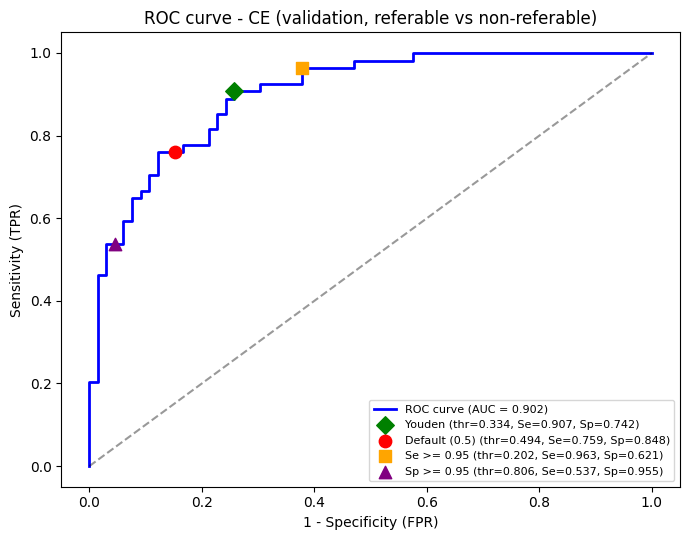


Validation metrics - candidate thresholds
Point                   Thr     Se     Sp    PPV    NPV
Youden                0.334  0.907  0.742  0.742  0.907
Default (0.5)         0.494  0.759  0.848  0.804  0.812
Se >= 0.95            0.202  0.963  0.621  0.675  0.953
Sp >= 0.95            0.806  0.537  0.955  0.906  0.716

	CE test set @ thr=0.202 (screening):
	Se=0.972  Sp=0.455  PPV=0.593  NPV=0.952


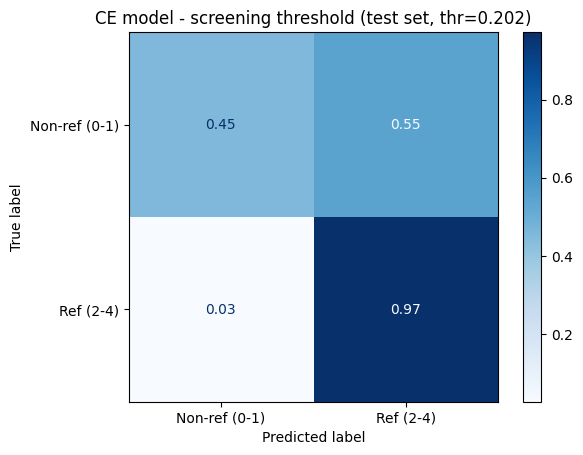

CORAL model - tuning on validation


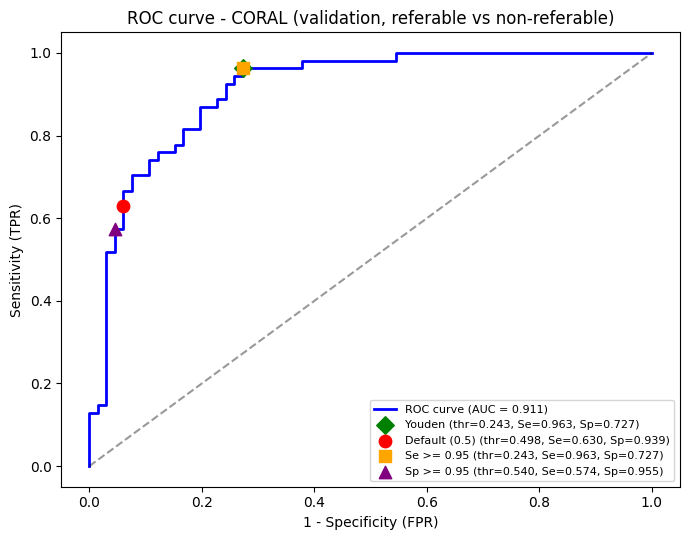


Validation metrics - candidate thresholds
Point                   Thr     Se     Sp    PPV    NPV
Youden                0.243  0.963  0.727  0.743  0.960
Default (0.5)         0.498  0.630  0.939  0.895  0.756
Se >= 0.95            0.243  0.963  0.727  0.743  0.960
Sp >= 0.95            0.540  0.574  0.955  0.912  0.733

	CORAL test set @ thr=0.243 (screening):
	Se=0.906  Sp=0.655  PPV=0.682  NPV=0.894


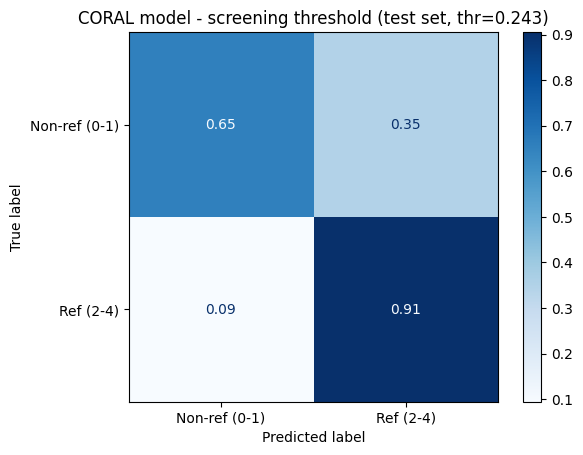

In [31]:
val_preds_ce_PFT, val_labels_ce_PFT, val_probs_ce_PFT, _ = validate_ce(model_ce_PFT, val_loader)
val_preds_coral_PFT, val_labels_coral_PFT, val_probs_coral_PFT, _ = validate_coral(
    model_coral_PFT, val_loader, compute_coral_importance(all_targets))

val_bin = (val_labels_ce_PFT >= 2).astype(int)

print("CE model - tuning on validation")
probs_ref_val_ce = val_probs_ce_PFT[:, 2:].sum(axis=1)
cand_ce, pts_ce, fpr_ce, tpr_ce = pick_best_threshold(probs_ref_val_ce, val_bin)
report_roc_plot('CE', cand_ce, pts_ce, fpr_ce, tpr_ce,
                roc_auc_score(val_bin, probs_ref_val_ce))
print_table(cand_ce, pts_ce, val_bin, probs_ref_val_ce, "Validation")

if pts_ce.get('Se >= 0.95') is not None:
    thr_screen_ce = cand_ce[pts_ce['Se >= 0.95'], 0]
    test_bin = (test_labels_ce_PFT >= 2).astype(int)
    probs_ref_test_ce = test_probs_ce_PFT[:, 2:].sum(axis=1)
    preds_screen_ce = (probs_ref_test_ce >= thr_screen_ce).astype(int)
    tn, fp, fn, tp = confusion_matrix(test_bin, preds_screen_ce).ravel()
    print(f"\n\tCE test set @ thr={thr_screen_ce:.3f} (screening):")
    print(f"\tSe={tp/(tp+fn):.3f}  Sp={tn/(tn+fp):.3f}  PPV={tp/(tp+fp):.3f}  NPV={tn/(tn+fn):.3f}")
    cm_screen = confusion_matrix(test_bin, preds_screen_ce, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_screen,
        display_labels=['Non-ref (0-1)', 'Ref (2-4)'])
    disp.plot(cmap=plt.cm.Blues, values_format='.2f')
    plt.title(f'CE model - screening threshold (test set, thr={thr_screen_ce:.3f})')
    plt.show()

print("CORAL model - tuning on validation")
probs_ref_val_coral = val_probs_coral_PFT[:, 2:].sum(axis=1)
cand_co, pts_co, fpr_co, tpr_co = pick_best_threshold(probs_ref_val_coral, val_bin)
report_roc_plot('CORAL', cand_co, pts_co, fpr_co, tpr_co,
                roc_auc_score(val_bin, probs_ref_val_coral))
print_table(cand_co, pts_co, val_bin, probs_ref_val_coral, "Validation")

if pts_co.get('Se >= 0.95') is not None:
    thr_screen_co = cand_co[pts_co['Se >= 0.95'], 0]
    probs_ref_test_coral = test_probs_coral_PFT[:, 2:].sum(axis=1)
    preds_screen_co = (probs_ref_test_coral >= thr_screen_co).astype(int)
    tn, fp, fn, tp = confusion_matrix(test_bin, preds_screen_co).ravel()
    print(f"\n\tCORAL test set @ thr={thr_screen_co:.3f} (screening):")
    print(f"\tSe={tp/(tp+fn):.3f}  Sp={tn/(tn+fp):.3f}  PPV={tp/(tp+fp):.3f}  NPV={tn/(tn+fn):.3f}")
    cm_screen = confusion_matrix(test_bin, preds_screen_co, normalize='true')
    disp = ConfusionMatrixDisplay(confusion_matrix=cm_screen,
        display_labels=['Non-ref (0-1)', 'Ref (2-4)'])
    disp.plot(cmap=plt.cm.Blues, values_format='.2f')
    plt.title(f'CORAL model - screening threshold (test set, thr={thr_screen_co:.3f})')
    plt.show()

### Evaluation after threshold selection

Model | Threshold | Sensitivity | Specificity | PPV | NPV
------|-----------|-------------|-------------|-----|-----
CE | 0.202 | **0.972** | 0.455 | 0.593 | **0.952**
CORAL | 0.243 | 0.906 | **0.655** | **0.682** | 0.894

The threshold tuning and clinical screening evaluation reveal critical operational distinctions between the standard Cross-Entropy and the CORAL architectures when optimizing for real-world medical deployment. By shifting from standard multi-class decision boundaries to a binary referable versus non-referable screening paradigm the evaluation framework effectively measures how well each model prioritizes patient safety and diagnostic reliability.

Analyzing validation performance through receiver operating characteristic curves and candidate operational thresholds demonstrates that both models achieve strong, highly comparable discriminative capacity (validation AUC of 0.902 for CE versus 0.911 for CORAL). However, they behave somewhat differently when subjected to strict clinical constraints.

To satisfy a high-sensitivity screening requirement ($\text{Se} \ge 0.95$), the Cross-Entropy model requires tuning its decision threshold down to $\text{Thr} = 0.202$. On the test set, this successfully secures an exceptional detection rate with a sensitivity of 0.972 and a high NPV of 0.952, but it results in a lower specificity of 0.455 and a PPV of 0.593. The confusion matrix shows that 55% of non-referable subjects are incorrectly classified as positives, generating a notable volume of false alarms and leading to an inefficient waste of specialist medical resources.

In contrast, the CORAL model achieves a well-balanced operating point where the high-sensitivity target ($\text{Se} \ge 0.95$) and the Youden index converge at $\text{Thr} = 0.243$. This demonstrates CORAL's strong discriminative power between healthy and severe cases. On the test set, it captures 91% of referable cases while maintaining a solid 65.5% specificity and a PPV of 0.682. CORAL's inherent polarization bias, which caused structural collapse in multi-grade classification, becomes a powerful advantage here by cleanly suppressing false positives down to a 0.35 false positive rate while retaining a robust NPV of 0.894.

Ultimately, these findings indicate that while standard Cross-Entropy serves as a highly competitive baseline, particularly effective when absolute maximum sensitivity is the primary clinical goal, the CORAL formulation offers a more balanced operational profile for automated diabetic retinopathy screening by achieving a better compromise between sensitivity and specificity.


## 10. Explaining model predictions (HiResCAM)


In [ ]:
from torch import tensor


def classify(model: torch.nn.Module, model_type: str = 'ce') -> tuple[np.ndarray, np.ndarray, np.ndarray, np.ndarray, torch.Tensor, np.ndarray]:
    """
    Classify all test images with given model. 
    
    Args:
        model (torch.nn.Module): The model to use for classification.
        model_type (str): The type of model ('ce' for Cross-Entropy, 'coral' for CORAL).
    Returns:
        Tuple of predicted labels, true labels, original images, background images, processed tensors, and predicted probabilities.
    """
    model.eval()
    preds, labels = [], []
    orig_imgs, bg_imgs, proc_tensors, probas_list = [], [], [], []
    for i in range(len(test_dataset)):
        orig = test_dataset.imgs[i]
        proc = preprocess_ben_graham(orig.copy(), img_size=224)
        proc_pil = Image.fromarray(proc).convert('RGB')
        tensor = eval_transforms(proc_pil).unsqueeze(0).to(DEVICE)

        with torch.no_grad():
            logits = model(tensor)
            if model_type == 'ce':
                probas = torch.softmax(logits, dim=1)
                p = probas.argmax(dim=1).item()
            else:
                probas = torch.sigmoid(logits)
                p = proba_to_label(probas).item()
                class_probs = torch.cat([
                    1 - probas[:, :1],
                    probas[:, :-1] - probas[:, 1:],
                    probas[:, -1:],
                ], dim=1)
                probas = class_probs

        preds.append(p)
        labels.append(int(test_dataset.labels[i].item()))
        orig_imgs.append(orig)
        bg_imgs.append(proc)
        proc_tensors.append(tensor.squeeze(0))
        probas_list.append(probas.squeeze(0).cpu().numpy())
    return (np.array(preds), np.array(labels), np.array(orig_imgs),
            np.array(bg_imgs), torch.stack(proc_tensors), np.array(probas_list))


def select_correct_wrong(preds: np.ndarray, labels: np.ndarray) -> tuple[dict[int, int], dict[int, int]]:
    """
    Select one correct and one wrong sample index for each grade (0-4) from predictions and labels.

    Args:
        preds: numpy array of predicted labels.
        labels: numpy array of true labels.
    Returns:
        correct_idx: dictionary mapping grade to index of a correct prediction (or None if none).
        wrong_idx: dictionary mapping grade to index of a wrong prediction (or None if none).
    """
    correct_idx, wrong_idx = {}, {}
    for grade in range(5):
        grade_mask = labels == grade
        correct = grade_mask & (preds == grade)
        wrong   = grade_mask & (preds != grade)
        correct_idx[grade] = np.where(correct)[0][0] if correct.any() else None
        wrong_idx[grade]   = np.where(wrong)[0][0]   if wrong.any()   else None
    return correct_idx, wrong_idx


def get_target_layers(model: torch.nn.Module, block: int) -> list[nn.Module]:
    """
    Return target layer list for HiResCAM given the block stage number for EfficientNetV2.
    
    Args:
        model: The model for which to get target layers.
        block: The block stage number (1 to len(model.blocks)).     
    Returns:
        A list containing the target module.
    """
    max_blocks = len(model.blocks)
    
    if block < 1 or block > max_blocks:
        raise ValueError(
            f"Invalid block number {block}. "
            f"The EfficientNetV2 variant in this model has only {max_blocks} main blocks (choose between 1 and {max_blocks})."
        )
    
    target = model.blocks[block - 1][-1]
    
    return [target]

def visualize_model(cam: torch.nn.Module, preds: np.ndarray, model_name: str, indices: dict[int, int], title: str = "Model visualization") -> None:
    """
    Plot original, Ben Graham, CAM overlay and confidence for selected indices.
    
    Args:
        cam: HiResCAM object.
        preds: numpy array of predicted labels.
        model_name: string for plot title.
        indices: dictionary mapping grade to index of sample to visualize.
        title: Title for the visualization (default: "Model visualization").
    """
    fig, axes = plt.subplots(5, 3, figsize=(13, 14))
    fig.suptitle(f'{title} - {model_name}', fontsize=14, y=0.98)

    for row, grade in enumerate(range(5)):
        idx = indices[grade]
        if idx is None:
            for col in range(3):
                axes[row, col].text(0.5, 0.5, '(no sample)', ha='center', va='center')
                axes[row, col].axis('off')
            continue

        orig = orig_imgs[idx]
        bg = bg_imgs[idx]
        orig_float = orig.astype(np.float32) / 255.0
        tensor = proc_tensors[idx].unsqueeze(0).clone().detach().to(DEVICE)
        tensor.requires_grad_(True)

        gt = int(ce_labels[idx])
        pd = int(preds[idx])

        if model_name == "CORAL":
            target = min(pd, 3)
        else:
            target = pd

        targets = [ClassifierOutputTarget(target)]
        grayscale_cam = cam(input_tensor=tensor, targets=targets)[0]
        overlay = show_cam_on_image(orig_float, grayscale_cam, use_rgb=True)

        axes[row, 0].imshow(orig)
        axes[row, 0].set_title(f'Original (true={gt})')
        axes[row, 0].axis('off')

        axes[row, 1].imshow(bg)
        axes[row, 1].set_title('Ben Graham')
        axes[row, 1].axis('off')

        axes[row, 2].imshow(overlay)
        axes[row, 2].set_title(f'HiResCAM block {BLOCK} (pred={pd})')
        axes[row, 2].axis('off')

    plt.tight_layout()
    plt.show()

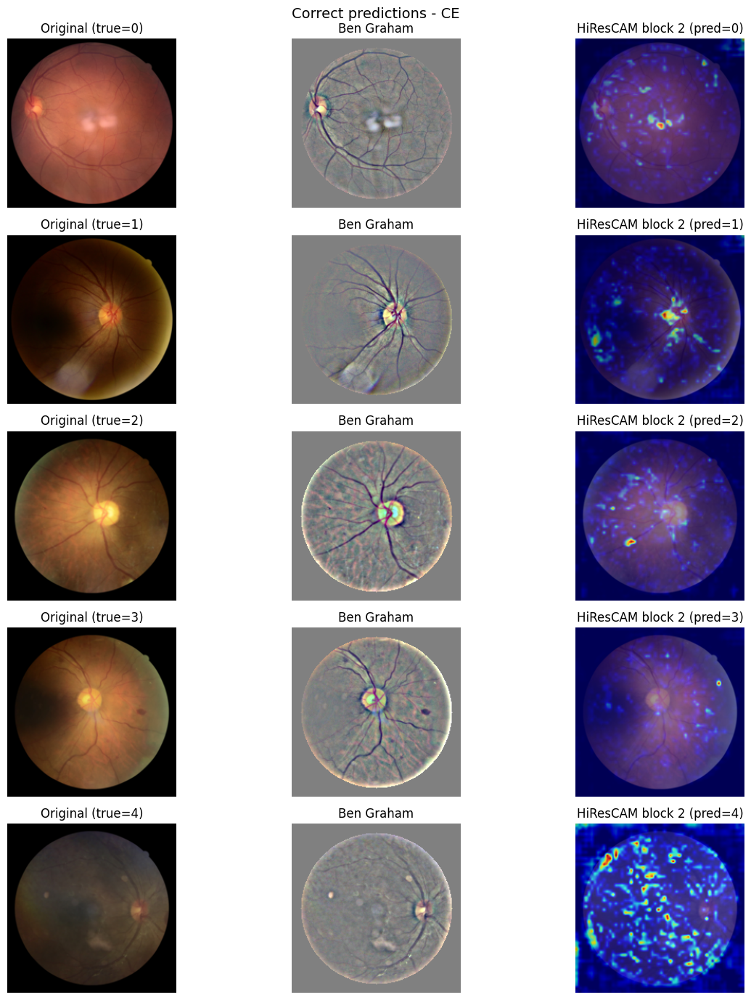

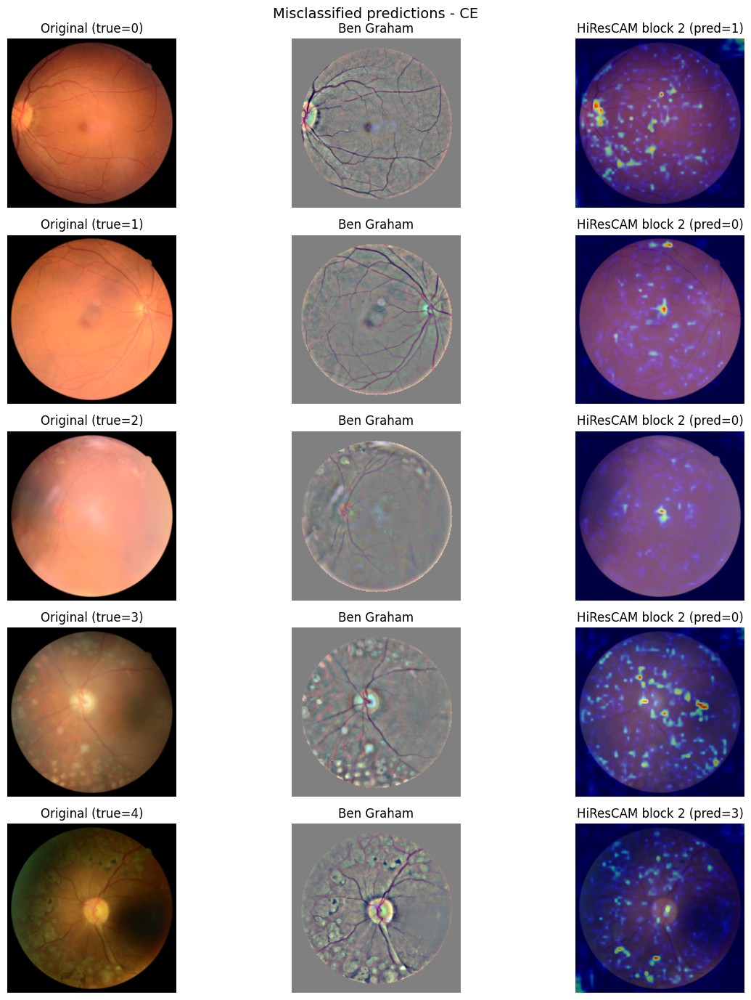

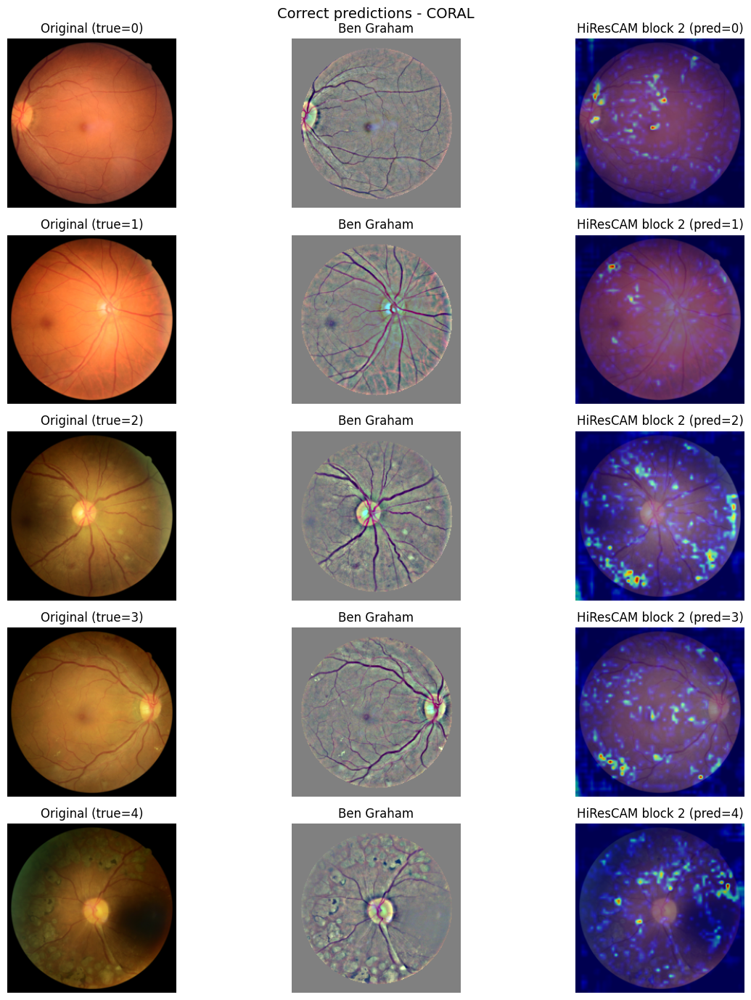

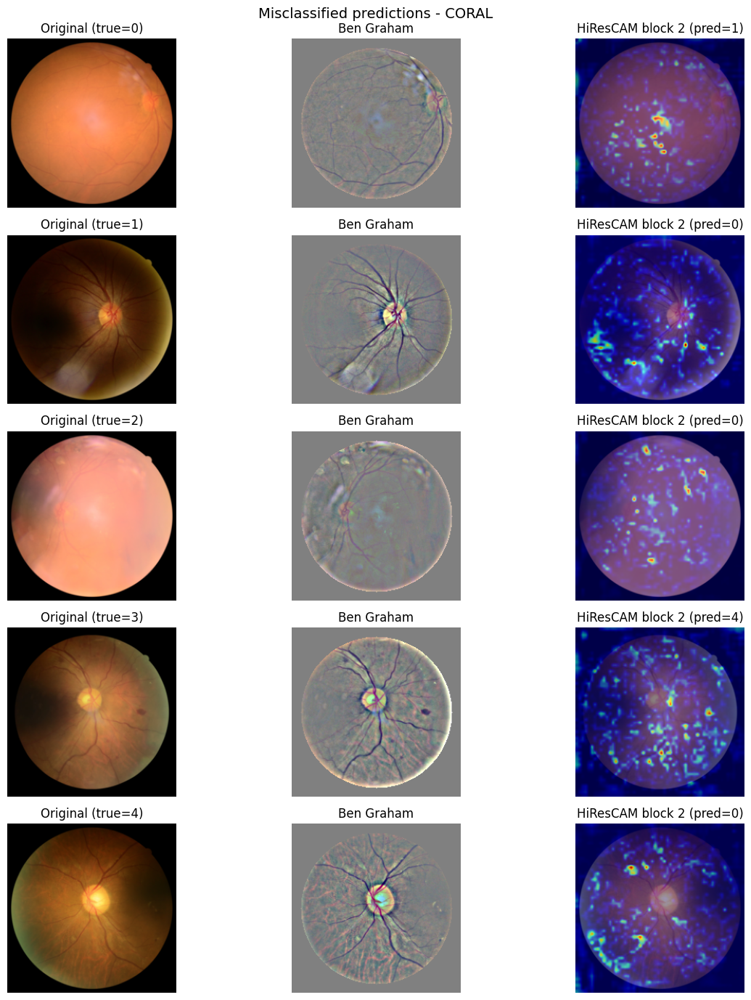

In [33]:
BLOCK = 2
ce_preds, ce_labels, orig_imgs, bg_imgs, proc_tensors, _ = classify(model_ce_PFT, 'ce')

coral_preds, coral_labels, _, _, _, _ = classify(model_coral_PFT, 'coral')

ce_correct, ce_wrong = select_correct_wrong(ce_preds, ce_labels)
coral_correct, coral_wrong = select_correct_wrong(coral_preds, coral_labels)

ce_target_layers = get_target_layers(model_ce_PFT, BLOCK)
coral_target_layers = get_target_layers(model_coral_PFT, BLOCK)

ce_cam = HiResCAM(model=model_ce_PFT, target_layers=ce_target_layers)
coral_cam = HiResCAM(model=model_coral_PFT, target_layers=coral_target_layers)

visualize_model(ce_cam, ce_preds, 'CE',
                ce_correct, 'Correct predictions')
visualize_model(ce_cam, ce_preds, 'CE',
                ce_wrong, 'Misclassified predictions')

visualize_model(coral_cam, coral_preds, 'CORAL',
                coral_correct, 'Correct predictions')
visualize_model(coral_cam, coral_preds, 'CORAL',
                coral_wrong, 'Misclassified predictions')


The HiResCAM visual explanations provide crucial interpretability insights into how model decisions are driven by disease-specific retinal features, demonstrating that intermediate network layers, specifically Block 2, offer superior diagnostic localization compared to deeper semantic representations. Visualizations extracted from Block 2 successfully capture high-resolution spatial details, aligning activation heatmaps tightly with clinical markers such as tiny red microaneurysms and small blot hemorrhages. In contrast, deeper representations suffer from severe spatial diffusion due to downsampling, producing overly generalized and blurred heatmaps that bleed across the fundus background and fail to isolate precise pathological structures. Consequently, these intermediate blocks provide a significantly sharper, more reliable localization profile for inspecting model behavior and verifying whether predictions are genuinely grounded in clinical pathologies rather than background artifacts during automated diabetic retinopathy screening.

A detailed look at the HiResCAM heatmaps across different models and disease grades shows clear patterns in how they spot eye damage. When looking at correct predictions, both models successfully highlight exact medical signs, such as widespread pathological changes in severe stages. However, examining incorrect predictions reveals that both architectures are occasionally susceptible to severe misclassification, such as in the notable failure cases where a true Grade 3 or even a severe Grade 4 instance is entirely misclassified as no apparent retinopathy (Grade 0).

Crucially, the HiResCAM heatmaps provide a visual explanation for these drastic errors: when both models fail catastrophically, the activation maps show a complete breakdown in localized feature attention. Instead of focusing on specific clinical lesions like microaneurysms or hemorrhages, the heatmaps for these major misclassifications become diffuse, unfocused, or misaligned, indicating that the network failed to properly extract or weigh the pathological evidence. This unmasks a shared vulnerability where visual feature attention collapses entirely, representing a critical clinical safety hazard that could lead to unmanaged disease progression if deployed without safety thresholds.